In [3]:
!pip install torchvision==0.18.0 --quiet
!pip install torchtext==0.18.0 --quiet
!pip install torch==2.3.0 --quiet
#!pip install numpy==1.26.4 --quiet
!pip install tqdm --quiet


[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

from PIL import Image
import cv2
from io import BytesIO
from tqdm import tqdm

In [3]:
# !pip install opendatasets --quiet

In [25]:
# import opendatasets as od
# od.download("https://www.kaggle.com/datasets/kunalgupta2616/flickr-8k-images-with-captions/data")

In [26]:
data=[]
with open('/kaggle/input/flickr-8k-images-with-captions/captions.txt', 'r') as file:
    lines = file.readlines()
    for line in lines:
        data.append(line.strip())



In [27]:
data=data[1:]
data[:5]

['1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg,A girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .']

In [28]:
s='1000268201_693b08cb0e.jpg,A girl going into a wooden building .'
print(s.split(",")[1])

A girl going into a wooden building .


In [29]:
img=[]
caption=[]
for i in data:
  n=i.split(",")
  img.append(n[0])
  caption.append(n[1])


In [30]:
img[:5]

['1000268201_693b08cb0e.jpg',
 '1000268201_693b08cb0e.jpg',
 '1000268201_693b08cb0e.jpg',
 '1000268201_693b08cb0e.jpg',
 '1000268201_693b08cb0e.jpg']

In [31]:
caption[:5]

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [32]:
len(img),len(caption)

(40455, 40455)

In [33]:
df=pd.DataFrame()
df['image']=img
df['caption']=caption

In [34]:
df

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [35]:
fl=df["image"]=="997722733_0cb5439472.jpg"
df[fl]

,image,caption
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .
40454,997722733_0cb5439472.jpg,A rock climber practices on a rock climbing wa...


In [36]:
p="/kaggle/input/flickr-8k-images-with-captions/Images"
df["image"]=df["image"].apply(lambda x:os.path.join(p,x))

In [37]:
df

,image,caption
0,/kaggle/input/flickr-8k-images-with-captions/I...,A child in a pink dress is climbing up a set o...
1,/kaggle/input/flickr-8k-images-with-captions/I...,A girl going into a wooden building .
2,/kaggle/input/flickr-8k-images-with-captions/I...,A little girl climbing into a wooden playhouse .
3,/kaggle/input/flickr-8k-images-with-captions/I...,A little girl climbing the stairs to her playh...
4,/kaggle/input/flickr-8k-images-with-captions/I...,A little girl in a pink dress going into a woo...
...,...,...
40450,/kaggle/input/flickr-8k-images-with-captions/I...,A man in a pink shirt climbs a rock face
40451,/kaggle/input/flickr-8k-images-with-captions/I...,A man is rock climbing high in the air .
40452,/kaggle/input/flickr-8k-images-with-captions/I...,A person in a red shirt climbing up a rock fac...
40453,/kaggle/input/flickr-8k-images-with-captions/I...,A rock climber in a red shirt .


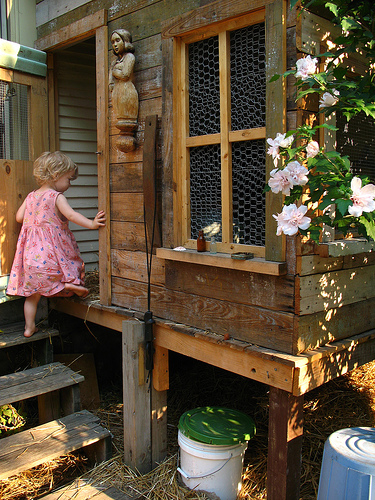

In [38]:
Image.open(df["image"][0])

In [39]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(np.array(df["image"]),np.array(df["caption"]),test_size=0.001,shuffle=True,random_state=42)

In [40]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((40414,), (41,), (40414,), (41,))

In [41]:
from torchtext.vocab import build_vocab_from_iterator
from torchtext.data import get_tokenizer

In [42]:
tokenizer=get_tokenizer("basic_english")


In [43]:
tokens=tokenizer(y_train[0])
tokens

['a', 'soccer', 'game', 'on', 'a', 'grassy', 'field', '.']

In [44]:
def prepare_data (s):
  tok=tokenizer(s)
  n_tok=[]
  for t in tok :
    if t.isalnum()== False :
      continue
    n_tok.append(t.lower())

  return n_tok



In [45]:
def pad_seq(s,m,p_t):
  if len(s)>=m:
    return s[:m]
  else:
    return s + [p_t] * (m-len(s))

In [46]:
tt=df["caption"].map(prepare_data)
tt.map(len).nlargest(10)

1325     33
2596     33
4660     31
14244    31
30553    31
16688    30
20890    30
858      29
8425     29
9678     29
Name: caption, dtype: int64

In [47]:
our_vocab= build_vocab_from_iterator(df["caption"].map(prepare_data),specials=["<UNK>","<PAD>","<SOS>","<EOS>"],max_tokens=4000)
our_vocab.set_default_index(our_vocab["<UNK>"])

In [48]:
our_vocab.lookup_token(7)

'on'

In [49]:
our_vocab.lookup_token(3999)

'automobiles'

In [50]:
idd=our_vocab.lookup_indices(tokens)
idd

[4, 103, 160, 7, 4, 127, 52, 0]

In [51]:
t=our_vocab.lookup_tokens(idd)
t

['a', 'soccer', 'game', 'on', 'a', 'grassy', 'field', '<UNK>']

<Axes: >

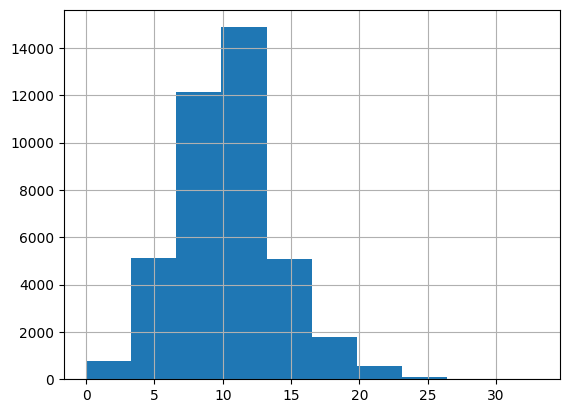

In [52]:
df["caption"].map(prepare_data).map(len).hist()

In [53]:
# vi import torch and torch vision after torch text==0.16.0

In [54]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

In [55]:
class OurDataset(Dataset):
  def __init__(self,x,y,vocab,transform=None):
    self.x=x
    self.y=y
    self.transform=transform
    self.vocab=vocab

  def __len__(self):
        return len(self.x)

  def __getitem__(self,index):
       img=Image.open(self.x[index]).convert("RGB")
       caption=self.y[index]

       caption=prepare_data(caption)

       caption=["<SOS>"]+caption+["<EOS>"]
       caption_input=caption[:-1]
       caption_output=caption[:]

       caption_input=pad_seq(caption_input,30,"<PAD>")
       caption_output=pad_seq(caption_output,30,"<PAD>")

       caption_input=caption_input[:-1]

       caption_input=self.vocab.lookup_indices(caption_input)
       caption_output=self.vocab.lookup_indices(caption_output)

       caption_input=torch.tensor(caption_input).long()
       caption_output=torch.tensor(caption_output).long()


       if self.transform is not None:
         img=self.transform(img)

      #  img=torch.tensor(np.array(img,dtype=float)).float()/255.0
      #  img=img.permute(2,0,1)

       return img, caption_input, caption_output



In [56]:
Trans=transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),

    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

In [57]:
Trans_t=transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

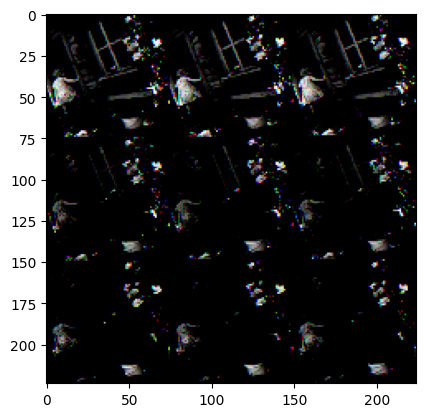

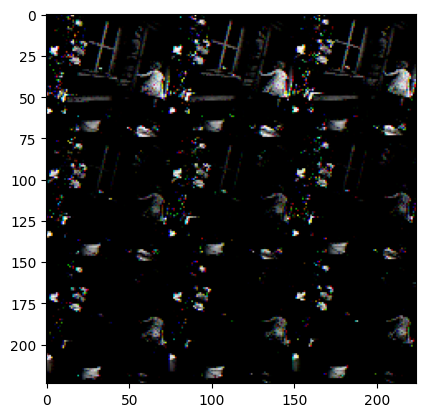

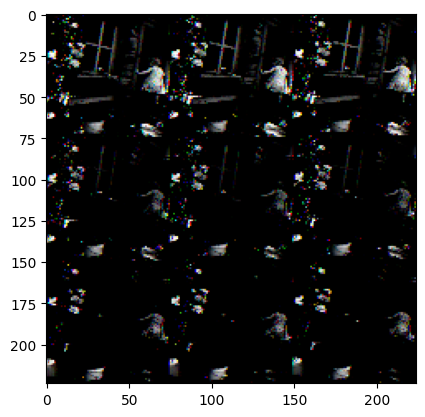

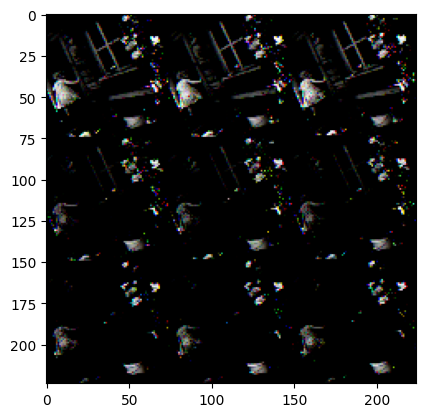

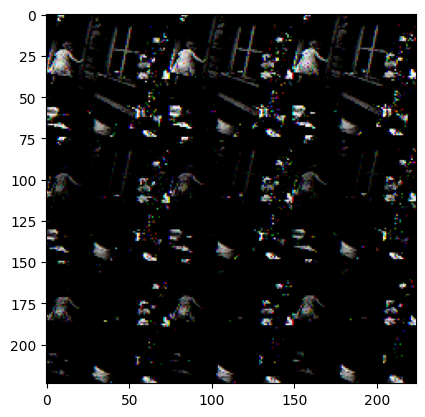

In [51]:
for i in range(5):
    plt.figure()
    img=Image.open(df["image"][0])
    img=Trans(img)
    img=np.array(img).reshape(224,224,3)
    plt.tight_layout()
    plt.imshow(img)

plt.show()

In [58]:
our_data_set=OurDataset(x_train,y_train,our_vocab,transform=Trans)
our_test=OurDataset(x_test,y_test,our_vocab,transform=Trans_t)

In [59]:
our_data_set[0][0].shape

torch.Size([3, 224, 224])

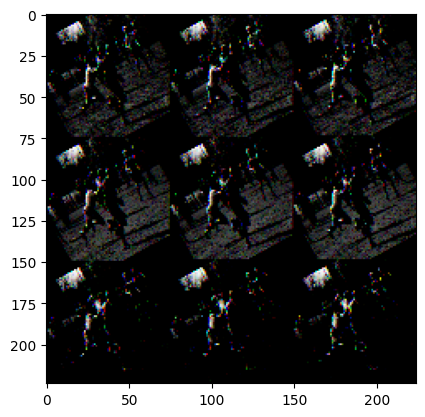

In [60]:
w=np.array(our_data_set[0][0].reshape(224,224,3))
plt.imshow(w)

In [61]:
our_data_loader=DataLoader(our_data_set,batch_size=32,shuffle=True)
our_test_loader=DataLoader(our_test,batch_size=1,shuffle=False)

In [62]:
for i ,j ,k in our_data_loader :
  print(i.shape)
  print(j.shape)
  print(k.shape)
  break

torch.Size([32, 3, 224, 224])
torch.Size([32, 29])
torch.Size([32, 30])


In [63]:
our_data_set[0][1:]

(tensor([  2,   4, 103, 160,   7,   4, 127,  52,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1]),
 tensor([  2,   4, 103, 160,   7,   4, 127,  52,   3,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1]))

In [64]:
our_vocab.lookup_tokens(np.array(our_data_set[0][1]))

['<SOS>',
 'a',
 'soccer',
 'game',
 'on',
 'a',
 'grassy',
 'field',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>']

In [65]:
our_vocab.lookup_tokens(np.array(our_data_set[0][2]))

['<SOS>',
 'a',
 'soccer',
 'game',
 'on',
 'a',
 'grassy',
 'field',
 '<EOS>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>']

In [66]:
#  1*1*100   1*29*100  32*30*100

In [67]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [68]:
features=torch.randn(32,100)
embeddings=torch.randn(32,29,100)
embeddings = torch.cat((features.unsqueeze(1), embeddings), dim=1)
print(embeddings.shape)

torch.Size([32, 30, 100])


In [69]:
from torchvision import models

In [70]:
resnet=models.resnet50(pretrained=True).to(device)
for param in resnet.parameters():
  param.requires_grad=False

In [71]:
m=list(resnet.children())
m

[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
 BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False),
 Sequential(
   (0): Bottleneck(
     (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
     (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
     (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (downsample): Sequential(
       (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
       (1): BatchNorm2d(256, eps=1e-05, momentum

In [72]:
class OurEncoder(nn.Module):
  def __init__(self,resnet,embed_size):
    super(OurEncoder,self).__init__()
    self.resnet=resnet
    self.embed_size=embed_size
    self.l1=nn.Sequential(*list(self.resnet.children())[:-1])
    self.l2=nn.Linear(2048,embed_size)
    self.relu=nn.ReLU()

    self.dropout=nn.Dropout(0.5)

  def forward(self,x):
    x=self.l1(x)
    x=x.view(x.size(0),-1)
    x=self.relu(x)
    x=self.dropout(x)
    x=self.l2(x)
    return x


In [73]:
our_resnet_model=OurEncoder(resnet,100).to(device)


In [74]:
b=torch.rand(32,3,224,224).to(device)
print(our_resnet_model(b).shape)

torch.Size([32, 100])


In [75]:
class OurDecoder(nn.Module):
  def __init__(self,embed_size,hidden_size,vocab_size):
    super(OurDecoder,self).__init__()
    self.embed_size=embed_size
    self.hidden_size=hidden_size
    self.vocab_size=vocab_size

    self.embedding=nn.Embedding(vocab_size,embed_size,1)
    self.lstm=nn.LSTM(embed_size,hidden_size,batch_first=True,num_layers=2)
    self.linear=nn.Linear(hidden_size,vocab_size)
    self.dropout=nn.Dropout(0.5)

  def forward(self,x,features):
    x=self.embedding(x)
    x=torch.cat((features.unsqueeze(1),x),dim=1)
    x,_=self.lstm(x)
    x=self.dropout(x)
    x=self.linear(x)

    return x

In [76]:
our_decoder=OurDecoder(100,256,len(our_vocab)).to(device)

In [77]:
x=torch.randint(0,len(our_vocab),(32,29)).to(device)
xx=torch.rand(32,100).to(device)
print(our_decoder(x,xx).shape)  #[32, 30, 4000]  >>target [32,30]

torch.Size([32, 30, 4000])


In [78]:
!pip install torchinfo --quiet

In [79]:
from torchinfo import summary

In [80]:
summary(our_resnet_model,input_size=(32,3,224,224))

Layer (type:depth-idx)                        Output Shape              Param #
OurEncoder                                    [32, 100]                 2,049,000
├─Sequential: 1-1                             [32, 2048, 1, 1]          --
│    └─Conv2d: 2-1                            [32, 64, 112, 112]        (9,408)
│    └─BatchNorm2d: 2-2                       [32, 64, 112, 112]        (128)
│    └─ReLU: 2-3                              [32, 64, 112, 112]        --
│    └─MaxPool2d: 2-4                         [32, 64, 56, 56]          --
│    └─Sequential: 2-5                        [32, 256, 56, 56]         --
│    │    └─Bottleneck: 3-1                   [32, 256, 56, 56]         (75,008)
│    │    └─Bottleneck: 3-2                   [32, 256, 56, 56]         (70,400)
│    │    └─Bottleneck: 3-3                   [32, 256, 56, 56]         (70,400)
│    └─Sequential: 2-6                        [32, 512, 28, 28]         --
│    │    └─Bottleneck: 3-4                   [32, 512, 28, 28

In [81]:
x = torch.randint(0, len(our_vocab), (32, 29)).to(device)
xx = torch.rand(32, 100).to(device)

summary(our_decoder, input_data=(x, xx))

Layer (type:depth-idx)                   Output Shape              Param #
OurDecoder                               [32, 30, 4000]            --
├─Embedding: 1-1                         [32, 29, 100]             400,000
├─LSTM: 1-2                              [32, 30, 256]             892,928
├─Dropout: 1-3                           [32, 30, 256]             --
├─Linear: 1-4                            [32, 30, 4000]            1,028,000
Total params: 2,320,928
Trainable params: 2,320,928
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 902.91
Input size (MB): 0.02
Forward/backward pass size (MB): 33.43
Params size (MB): 9.28
Estimated Total Size (MB): 42.73

In [82]:
class OurModel(nn.Module):
  def __init__(self):
    super(OurModel,self).__init__()
    self.encoder=OurEncoder(resnet,100)
    self.decoder=OurDecoder(100,256,len(our_vocab))

  def forward(self,x,y):
    features=self.encoder(x)
    x=self.decoder(y,features)
    return x

In [83]:
our_model=OurModel().to(device)

In [84]:
x = torch.randint(0, len(our_vocab), (32, 29)).to(device)
xx = torch.rand(32,3,224,224).to(device)
print(our_model(xx,x).shape)

torch.Size([32, 30, 4000])


In [85]:
x = torch.randint(0, len(our_vocab), (32, 29)).to(device)
xx = torch.rand(32,3,224,224).to(device)
summary(our_model, input_data=(xx, x))

Layer (type:depth-idx)                             Output Shape              Param #
OurModel                                           [32, 30, 4000]            --
├─OurEncoder: 1-1                                  [32, 100]                 2,049,000
│    └─Sequential: 2-1                             [32, 2048, 1, 1]          --
│    │    └─Conv2d: 3-1                            [32, 64, 112, 112]        (9,408)
│    │    └─BatchNorm2d: 3-2                       [32, 64, 112, 112]        (128)
│    │    └─ReLU: 3-3                              [32, 64, 112, 112]        --
│    │    └─MaxPool2d: 3-4                         [32, 64, 56, 56]          --
│    │    └─Sequential: 3-5                        [32, 256, 56, 56]         (215,808)
│    │    └─Sequential: 3-6                        [32, 512, 28, 28]         (1,219,584)
│    │    └─Sequential: 3-7                        [32, 1024, 14, 14]        (7,098,368)
│    │    └─Sequential: 3-8                        [32, 2048, 7, 7]        

In [86]:
!pip install tensorboard --quiet

In [87]:
from torch.utils.tensorboard import SummaryWriter

In [88]:
writer = SummaryWriter("runs")

In [89]:
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [90]:
our_vocab["<PAD>"]

1

In [91]:
our_loss=nn.CrossEntropyLoss(ignore_index=our_vocab["<PAD>"])
our_optimizer=optim.Adam(our_model.parameters(),lr=0.0001)

In [92]:
def our_train(epochs=100,our_model=our_model):

    train_loss_l=[]

    for epoch in range(epochs):

      train_loss_v=0.0
      our_model.train()

      for imgs_train_batch , cap_train_batch, cap_target_batch in tqdm (our_data_loader,f"Epoch = {epoch}") :
        imgs_train_batch=imgs_train_batch.to(device)
        cap_train_batch=cap_train_batch.to(device)
        cap_target_batch=cap_target_batch.to(device)

        

        cap_train_pred= our_model(imgs_train_batch,cap_train_batch)

        train_loss=our_loss(cap_train_pred.view(-1,len(our_vocab)),cap_target_batch.view(-1))

        our_optimizer.zero_grad()
        train_loss.backward()
        our_optimizer.step()
        train_loss_v +=train_loss.item()


      our_model.eval()
      with torch.inference_mode():

          ran=torch.randint(0,40,(1,)).item()

          img=Image.open(x_test[ran])

          plt.imshow(img)
          plt.show()

          t_img=our_test[ran][0].to(device).unsqueeze(0)
          t_cap=our_test[ran][1].to(device).unsqueeze(0)
          t_cap_target=our_test[ran][2].to(device).unsqueeze(0)

          cap_pred=our_model(t_img,t_cap)

          cap_pred=torch.argmax(torch.softmax(cap_pred,dim=2) ,dim=2).squeeze().cpu().detach().numpy() #1*30*1 >>> 30

          cap_target=t_cap_target.squeeze().cpu().detach().numpy() #1*30 >>> 30

          cap_pred=our_vocab.lookup_tokens(cap_pred)     #[t for t in  our_vocab.lookup_tokens(cap_pred) if t!=1 ]

          cap_target=our_vocab.lookup_tokens(cap_target)

          print(f"cap_pred = {cap_pred}")
          print(f"cap_target = {cap_target}")
          print()

      train_loss_l.append(train_loss_v/our_data_set.__len__())

      writer.add_scalar("Loss/Train", train_loss_l[-1], epoch)

      print(f"at epoch = {epoch+1} || train loss = {train_loss_l[-1]:.3f} ")

    writer.close()
    return train_loss_l


In [93]:
x_test[0] , y_test[0]

('/kaggle/input/flickr-8k-images-with-captions/Images/2973269132_252bfd0160.jpg',
 'A large wild cat is pursuing a horse across a meadow .')

In [94]:
tt=our_vocab.lookup_tokens(np.array(our_test[0][1]))
tt

['<SOS>',
 'a',
 'large',
 'wild',
 'cat',
 'is',
 '<UNK>',
 'a',
 'horse',
 'across',
 'a',
 'meadow',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>',
 '<PAD>']

Epoch = 0: 100%|██████████| 1263/1263 [06:15<00:00,  3.37it/s]


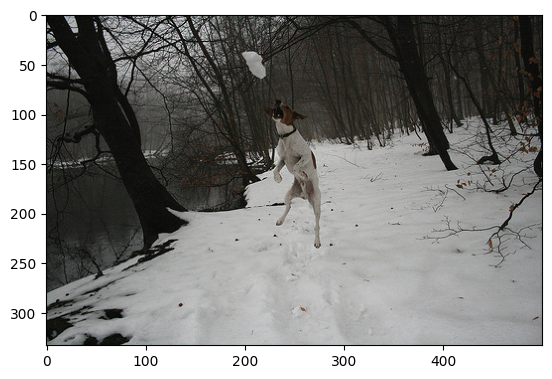

cap_pred = ['<SOS>', 'a', 'man', 'dog', 'dog', 'dog', 'is', 'in', 'a', 'a', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
cap_target = ['<SOS>', 'a', 'black', 'and', 'white', 'dog', 'is', 'leaping', 'from', 'a', 'snowy', 'path', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']

at epoch = 1 || train loss = 0.149 


Epoch = 1: 100%|██████████| 1263/1263 [06:11<00:00,  3.40it/s]


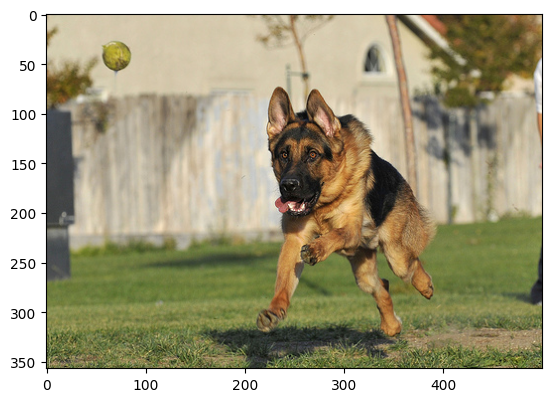

cap_pred = ['<SOS>', 'a', 'people', 'in', 'a', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
cap_target = ['<SOS>', 'shepherd', 'dog', 'catches', 'tennis', 'ball', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']

at epoch = 2 || train loss = 0.125 


Epoch = 2:   2%|▏         | 26/1263 [00:07<06:00,  3.43it/s]


KeyboardInterrupt: 

In [95]:
t_l=our_train(epochs=10,our_model=our_model)

In [145]:
def img_cap():
    
    our_model.eval()
    with torch.inference_mode():
    
      #ran=torch.randint(0,40,(1,)).item()
    
      img=Image.open("/kaggle/input/mmmmmmm3rfd/Hojbjerg20Bellingham.jpeg")
    
      plt.imshow(img)
      plt.show()
        
      #t_img=our_test[ran][0].to(device).unsqueeze(0)
        
      t_img=Trans_t(img).to(device).unsqueeze(0)
      x=our_model.encoder(t_img) # 1*100
      state=None  
      fin=[]  
      for _ in range (30):

          x,state=our_model.decoder.lstm(x,state) #1*256
          x=our_model.decoder.linear(x)  #1*256 * 256*4000 >>>1*4000
          x=torch.argmax(torch.softmax(x,dim=1) ,dim=1).squeeze().cpu().detach().numpy() #1*30*1 >>> 30
          
          x=our_vocab.lookup_token(x)     #[t for t in  our_vocab.lookup_tokens(cap_pred) if t!=1 ]
          
          fin.append(x)
          if x=="<EOS>": 
              break 
          x=torch.tensor(our_vocab([x])).to(device)#.unsqueeze(0)
         # print(x.shape)
          x=our_model.decoder.embedding(x)
          
         
    return fin
    


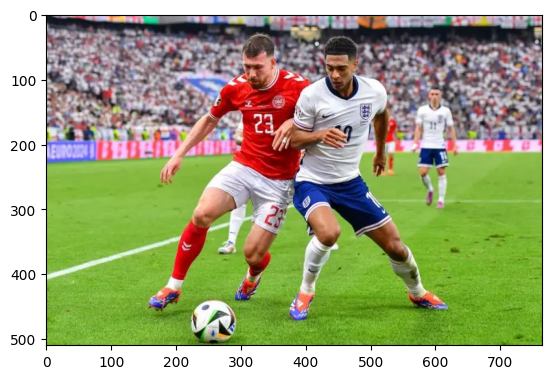

['<SOS>', 'a', 'group', 'of', 'people', 'are', 'playing', 'in', 'a', 'field', '<EOS>']


In [146]:
print(img_cap())

In [5]:
config_hp={"MAX_LEN":30,
"SPECIAL_TOKENS":["<PAD>","<UNK>","<SOS>","<EOS>"],
"MAX_VOCAB":4000,
"BATCH_SIZE":64,
"FEATURE_EMBEDDING_SIZE":150,
"LSTM_HIDDEN_SIZE":300,
"LSTM_N_LAYERS":3,
"LEARNING_RATE":0.0001,
"EPOCHS":40,
}


import os
import sys  

import numpy as np
import pandas as pd
import torch
from torchvision import transforms
from torch.utils.data import DataLoader ,Dataset
from sklearn.model_selection import train_test_split
from torchtext.vocab import build_vocab_from_iterator

from PIL import Image


import copy
import matplotlib.pyplot as plt
import torch
from torchtext.data import get_tokenizer

tokenizer = get_tokenizer("basic_english")

def prepare_data (sentence):
  tokens=tokenizer(sentence)
  tokens_l=[]
  for token in tokens :
    if token.isalnum()== False :
      continue
    tokens_l.append(token.lower())

  return tokens_l


def pad_sentence (sentence_l,max_len,pad_token):
  if len(sentence_l)>=max_len:
    return sentence_l[:max_len]
  else:
    return sentence_l + [pad_token] * (max_len-len(sentence_l))


def our_accuracy (target,pred): 
  target=target.squeeze() 
  pred=torch.round(torch.sigmoid(pred.squeeze()))
  n_correct = sum(target==pred).item()
  return  n_correct




class EarlyStopping:
    def __init__(self, patience=5, min_delta=0, restore_best_weights=True):
        self.patience = patience
        self.min_delta = min_delta
        self.restore_best_weights = restore_best_weights
        self.best_model = None
        self.best_loss = None
        self.best_accuracy = None  # New attribute to track best accuracy
        self.counter = 0
        self.status = ""

    def __call__(self, model, val_loss, val_accuracy):
        if self.best_loss is None or val_loss < self.best_loss:  # Update if val_loss is better
            self.best_loss = val_loss
            self.best_accuracy = val_accuracy  # Update best accuracy along with best loss
            self.best_model = copy.deepcopy(model.state_dict())
            self.counter = 0
            self.status = f"Improvement found, counter reset to {self.counter}. " \
                          # f"Best Loss: {self.best_loss:.4f}, Best Accuracy: {self.best_accuracy:.2f}%"

        elif self.best_loss - val_loss >= self.min_delta:
            self.best_model = copy.deepcopy(model.state_dict())
            self.best_loss = val_loss
            self.counter = 0
            self.status = f"Improvement found, counter reset to {self.counter}. " \
                          # f"Best Loss: {self.best_loss:.4f}, Best Accuracy: {self.best_accuracy:.2f}%"

        else:
            self.counter += 1
            self.status = f"No improvement in the last {self.counter} epochs. " \
                          # f"Best Loss: {self.best_loss:.4f}, Best Accuracy: {self.best_accuracy:.2f}%"
            if self.counter >= self.patience:
                self.status = f"Early stopping triggered after {self.counter} epochs. " \
                              f"Best Loss: {self.best_loss:.4f}, Best Accuracy: {self.best_accuracy:.2f}%"
                if self.restore_best_weights:
                    model.load_state_dict(self.best_model)
                return True
        return False


def save_checkpoint(model, optimizer, epoch, loss, filename="model_checkpoint.pth"):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, filename)


def plot_l_a(train_loss,test_loss,train_accuracy,test_accuracy,name): 
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    
    axs[0].plot(train_loss, label='Training Loss')
    axs[0].plot(test_loss, label='Test Loss')
    axs[0].set_title('Training and Test Loss over Epochs')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    #axs[0].set_ylim([0, 1])
    axs[0].legend()
    
    axs[1].plot(train_accuracy, label='Training Accuracy')
    axs[1].plot(test_accuracy, label='Test Accuracy')
    axs[1].set_title('Training and Test Accuracy over Epochs')
    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Accuracy')
    #axs[1].set_ylim([0, 100])
    axs[1].legend()
    
    plt.tight_layout()
    plt.savefig (r'D:\Sarcasm_Detection\images' + f"\{name}")
    plt.show()
    
    
def our_predict(s, our_model, our_vocab,config_hp, device):
   
    l=prepare_data(s)
   
    p_l=pad_sentence(l,config_hp["MAX_LEN"],config_hp["SPECIAL_TOKENS"][0])
   
    p_l=torch.tensor(our_vocab.lookup_indices(p_l),dtype=torch.long).reshape(1,-1).to(device)
    
    pred=our_model(p_l)
    
    pred=torch.round(torch.sigmoid(pred))
    pred=pred.cpu().detach().numpy().item()
    return pred



data=[]
with open('/kaggle/input/flickr-8k-images-with-captions/captions.txt', 'r') as file:
    lines = file.readlines()
    for line in lines:
        data.append(line.strip())

data=data[1:]

img=[]
caption=[]
for i in data:
  n=i.split(",")
  img.append(n[0])
  caption.append(n[1])


df=pd.DataFrame()
df['image']=img
df['caption']=caption

dir="/kaggle/input/flickr-8k-images-with-captions/Images"
df["image"]=df["image"].apply(lambda x:os.path.join(dir,x))


tokens_cap=df["caption"].map(prepare_data)


x_train,x_test,y_train,y_test=train_test_split(np.array(df["image"]),np.array(df["caption"]),test_size=0.001,shuffle=True,random_state=42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


our_vocab=build_vocab_from_iterator(df["caption"].map(prepare_data),specials=config_hp["SPECIAL_TOKENS"],max_tokens=config_hp["MAX_VOCAB"])
our_vocab.set_default_index(our_vocab[config_hp["SPECIAL_TOKENS"][1]])


class OurDataSet(Dataset):
  def __init__(self,x,y,vocab,max_len,transform=None):
    self.x=x
    self.y=y
    self.vocab=vocab
    self.max_len=max_len
    self.transform=transform

  def __len__(self):
    return len(self.x)
  def __getitem__(self, index):
    
       img=Image.open(self.x[index]).convert("RGB")
       caption=self.y[index]

       caption=prepare_data(caption)

       caption=[config_hp["SPECIAL_TOKENS"][2]]+caption+[config_hp["SPECIAL_TOKENS"][3]]
       caption_input=caption[:-1]
       caption_output=caption[:]

       caption_input=pad_sentence(caption_input,self.max_len,config_hp["SPECIAL_TOKENS"][0])
       caption_output=pad_sentence(caption_output,self.max_len,config_hp["SPECIAL_TOKENS"][0])

       caption_input=caption_input[:-1]

       caption_input=self.vocab.lookup_indices(caption_input)
       caption_output=self.vocab.lookup_indices(caption_output)

       caption_input=torch.tensor(caption_input).long()
       caption_output=torch.tensor(caption_output).long()


       if self.transform is not None:
         img=self.transform(img)

      #  img=torch.tensor(np.array(img,dtype=float)).float()/255.0
      #  img=img.permute(2,0,1)

       return img, caption_input, caption_output

trans_train=transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(),

    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

trans_test=transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

our_train_data_set=OurDataSet(x=x_train,y=y_train,vocab=our_vocab,max_len=config_hp["MAX_LEN"],transform=trans_train)
our_test_data_set=OurDataSet(x=x_test,y=y_test,vocab=our_vocab,max_len=config_hp["MAX_LEN"],transform=trans_test)

def get_datasets_and_loaders_for_lstm ():
   our_train_data_loader=DataLoader(our_train_data_set,batch_size=config_hp["BATCH_SIZE"],shuffle=True)
   our_test_data_loader=DataLoader(our_test_data_set,batch_size=config_hp["BATCH_SIZE"],shuffle=False)
   return our_train_data_loader,our_test_data_loader,our_train_data_set,our_test_data_set,our_vocab,x_test



if __name__ == "__main__":
  our_train_data_loader,our_test_data_loader,our_train_data_set,our_test_data_set,our_vocab,x_test=get_datasets_and_loaders_for_lstm()
  for i ,j ,k in our_train_data_loader :
    print(i.shape)
    print(j.shape)
    print(k.shape)
    break



import torch 
import torch.nn as nn
from torchvision import models


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

resnet=models.resnet50(pretrained=True).to(device)
for param in resnet.parameters():
  param.requires_grad=False
  
class OurEncoder(nn.Module):
  def __init__(self,resnet,embed_size):
    super(OurEncoder,self).__init__()
    self.resnet=resnet
    self.embed_size=embed_size
    self.l1=nn.Sequential(*list(self.resnet.children())[:-1])
    self.l2=nn.Linear(2048,embed_size)
    self.relu=nn.ReLU()

    self.dropout=nn.Dropout(0.5)

  def forward(self,x):
    x=self.l1(x)
    x=x.view(x.size(0),-1)
    x=self.relu(x)
    x=self.dropout(x)
    x=self.l2(x)
    return x
  
 
class OurDecoder(nn.Module):
  def __init__(self,embed_size,hidden_size,vocab_size,n_layers):
    super(OurDecoder,self).__init__()
    self.embed_size=embed_size
    self.hidden_size=hidden_size
    self.vocab_size=vocab_size
    self.n_layers=n_layers

    self.embedding=nn.Embedding(vocab_size,embed_size,0)
    self.lstm=nn.LSTM(embed_size,hidden_size,batch_first=True,num_layers=self.n_layers)
    self.linear=nn.Linear(hidden_size,vocab_size)
    self.dropout=nn.Dropout(0.5)

  def forward(self,x,features):
    x=self.embedding(x)
    x=torch.cat((features.unsqueeze(1),x),dim=1)
    x,_=self.lstm(x)
    x=self.dropout(x)
    x=self.linear(x)

    return x
  
class OurModel(nn.Module):
  def __init__(self,embed_size,hidden_size,vocab_size,n_layers):
    super(OurModel,self).__init__()
    self.encoder=OurEncoder(resnet,embed_size)
    self.decoder=OurDecoder(embed_size,hidden_size,vocab_size,n_layers)

  def forward(self,x,y):
    features=self.encoder(x)
    x=self.decoder(y,features)
    return x
 
if __name__=="__main__": 
    our_model=OurModel(config_hp["FEATURE_EMBEDDING_SIZE"],config_hp["LSTM_HIDDEN_SIZE"],config_hp["MAX_VOCAB"],config_hp["LSTM_N_LAYERS"]).to(device)
    x = torch.randint(0, config_hp["MAX_VOCAB"], (32, 29)).to(device)
    xx = torch.rand(32,3,224,224).to(device)
    print(our_model(xx,x).shape)




torch.Size([64, 3, 224, 224])
torch.Size([64, 29])
torch.Size([64, 30])


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 195MB/s]


torch.Size([32, 30, 4000])


In [6]:
our_vocab["<PAD>"]


0

In [7]:

import os 
import sys

import torch
import torch.nn as nn

from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import ImageDraw, ImageFont, Image


our_train_data_loader, our_test_data_loader,our_train_data_set,our_test_data_set,our_vocab,x_test=get_datasets_and_loaders_for_lstm()
 
device="cuda" if torch.cuda.is_available() else "cpu"

our_lstm_model=OurModel(config_hp["FEATURE_EMBEDDING_SIZE"],config_hp["LSTM_HIDDEN_SIZE"],config_hp["MAX_VOCAB"],config_hp["LSTM_N_LAYERS"]).to(device)

early_stopping = EarlyStopping(patience=20, min_delta=0)
our_loss=nn.CrossEntropyLoss(ignore_index=our_vocab["<PAD>"])
our_optimizer =torch.optim.AdamW(our_lstm_model.parameters(),lr=config_hp["LEARNING_RATE"])

# check_point=torch.load("/kaggle/working/model_checkpoint.pth")

# our_optimizer.load_state_dict(check_point["optimizer_state_dict"])
# our_lstm_model.load_state_dict(check_point["model_state_dict"])


def our_train(epochs,our_model):
  

    writer = SummaryWriter('runs\lstm-12')
    
    train_loss_l=[]
    
    for epoch in range(epochs): 
    
    
      train_loss_v=0.0
      
      our_model.train()  
      for imgs_train_batch , cap_train_batch, cap_target_batch in tqdm (our_train_data_loader,f"Epoch = {epoch}") : 
        
        imgs_train_batch=imgs_train_batch.to(device)
        cap_train_batch=cap_train_batch.to(device)
        cap_target_batch=cap_target_batch.to(device)
    
        cap_train_pred= our_model(imgs_train_batch,cap_train_batch)

        train_loss=our_loss(cap_train_pred.view(-1,len(our_vocab)),cap_target_batch.view(-1))

        our_optimizer.zero_grad()
        train_loss.backward()
        our_optimizer.step()
        train_loss_v +=train_loss.item()
      
      # our_model.eval()
      # with torch.inference_mode(): 
        
      #     ran=torch.randint(0,40,(1,)).item()

      #     img=Image.open(x_test[ran])

      #     t_img=our_test_data_set[ran][0].to(device).unsqueeze(0)
      #     t_cap=our_test_data_set[ran][1].to(device).unsqueeze(0)
      #     t_cap_target=our_test_data_set[ran][2].to(device).unsqueeze(0)

      #     cap_pred=our_model(t_img,t_cap)

      #     cap_pred=torch.argmax(torch.softmax(cap_pred,dim=2) ,dim=2).squeeze().cpu().detach().numpy() #1*30*1 >>> 30

      #     cap_target=t_cap_target.squeeze().cpu().detach().numpy() #1*30 >>> 30

      #     cap_pred=our_vocab.lookup_tokens(cap_pred)     #[t for t in  our_vocab.lookup_tokens(cap_pred) if t!=1 ]

      #     cap_target=our_vocab.lookup_tokens(cap_target)

      #     print(f"cap_pred = {cap_pred}")
      #     print(f"cap_target = {cap_target}")
      #     print()
          
      #     img = img.resize((224, 224))
      #     fig = plt.figure()
      #     plt.imshow(img)
      #     plt.title(f"cap_pred = {cap_pred} \n cap_target = {cap_target}")

      #     buf = BytesIO()
      #     plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
      #     buf.seek(0)
      #     img_with_title = Image.open(buf).convert('RGB')
      #     img_array = np.array(img_with_title)

      #     img_tensor = torch.from_numpy(img_array).float()
      #     img_tensor = img_tensor.permute(2, 0, 1).unsqueeze(0)/ 255.0
      #     plt.close(fig)

      #     plt.figure(figsize=(50,15))
          
      #     plt.imshow(img)
      #     plt.title(f"cap_pred = {cap_pred} \n cap_target = {cap_target}")
          
      #     plt.show()
         
      our_model.eval()
      with torch.inference_mode():
        
          #ran=torch.randint(0,40,(1,)).item()
          ran=torch.randint(0,40,(1,)).item()

          img=Image.open(x_test[ran]).convert('RGB')
        
          #img=Image.open(img_dir)
          t_img=our_test_data_set[ran][0].to(device).unsqueeze(0)
          #t_cap=our_test_data_set[ran][1].to(device).unsqueeze(0)
          t_cap_target=our_test_data_set[ran][2].to(device).unsqueeze(0)
          cap_target=t_cap_target.squeeze().cpu().detach().numpy()
          cap_target=our_vocab.lookup_tokens(cap_target)
  
          #t_img=our_test[ran][0].to(device).unsqueeze(0)
            
          #t_img=trans_test(img).to(device).unsqueeze(0)
          x=our_model.encoder(t_img) # 1*100
          state=None  
          final_output=[] 
           
          for _ in range (config_hp["MAX_LEN"]):
    
              x,state=our_model.decoder.lstm(x,state) #1*256
              x=our_model.decoder.linear(x)  #1*256 * 256*4000 >>>1*4000
              x=torch.argmax(torch.softmax(x,dim=1) ,dim=1).squeeze().cpu().detach().numpy() #1*30*1 >>> 30
              
              x=our_vocab.lookup_token(x)     #[t for t in  our_vocab.lookup_tokens(cap_pred) if t!=1 ]
              
              final_output.append(x)
              # if x==config_hp["SPECIAL_TOKENS"][3]: 
              #     break 
              x=torch.tensor(our_vocab([x])).to(device)#.unsqueeze(0)
             # print(x.shape)
              x=our_model.decoder.embedding(x)
          print(final_output)
          print(cap_target)
              
          img = img.resize((224, 224))
          fig = plt.figure()
          plt.imshow(img)
          plt.title(f"cap_pred = {final_output} \n cap_target = {cap_target}")

          buf = BytesIO()
          plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
          buf.seek(0)
          img_with_title = Image.open(buf).convert('RGB')
          img_array = np.array(img_with_title)

          img_tensor = torch.from_numpy(img_array).float()
          img_tensor = img_tensor.permute(2, 0, 1).unsqueeze(0)/ 255.0
          plt.close(fig)
          
          
          plt.figure(figsize=(50,15))
          
          plt.imshow(img)
          plt.title(f"cap_pred = {final_output} \n cap_target = {cap_target}")
          
          plt.show()
         # plt.imshow(img)
         # title=" ".join(final_output)
         # plt.axis('off')
         # plt.title(f"predicted Caption: {title} \n target cap: {cap_target}",fontsize=10)
         # plt.show()

      train_loss_l.append(train_loss_v/our_train_data_set.__len__())

      writer.add_scalar("Loss/Train", train_loss_l[-1], epoch)
      writer.add_images("Images/Test", img_tensor, epoch)
  
          
      print(f"at epoch = {epoch+1} || train loss = {train_loss_l[-1]:.3f}")
      
      if (epoch + 1) % 2 == 0:
            save_checkpoint(our_model,our_optimizer,epoch + 1, train_loss_l[-1],'/kaggle/working/model_checkpoint.pth')
            print(f"Checkpoint saved at epoch {epoch + 1}.")

    #   if early_stopping(our_model, train_loss_l[-1],train_loss_l[-1]):
    #         print(early_stopping.status)
    #         save_checkpoint(our_model,our_optimizer,epoch + 1, train_loss_l[-1], '/kaggle/working/best_model.pth')
    #         print("Early stopping triggered!")
    #         writer.close()
    #         break 

    # if early_stopping.counter < early_stopping.patience:
    #     save_checkpoint(our_model, our_optimizer, epoch+1, train_loss_l[-1], '/kaggle/working/final_model.pth')
    #     writer.close()
    #     print("Training completed without early stopping. Final model saved.")
    writer.close()
    return train_loss_l


 



E0000 00:00:1749553161.059818      10 common_lib.cc:612] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: === 
learning/45eac/tfrc/runtime/common_lib.cc:230


Epoch = 0: 100%|██████████| 632/632 [06:30<00:00,  1.62it/s]


['<SOS>', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a', 'a']
['<SOS>', 'a', 'very', 'large', 'group', 'of', 'people', 'standing', 'crowded', 'together', 'outside', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


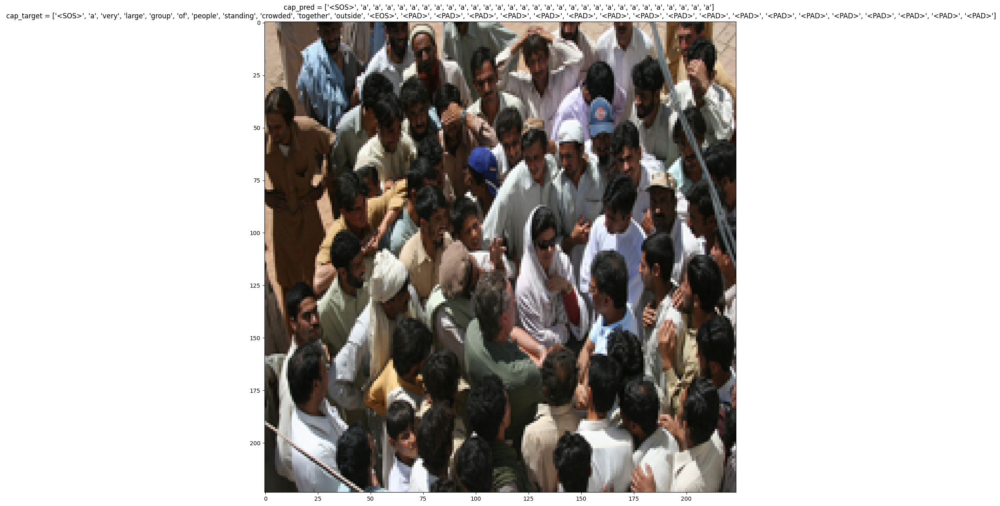

at epoch = 1 || train loss = 0.081


Epoch = 1: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'dog', 'in', 'a', '<EOS>', '<EOS>', 'a', '<EOS>', '<EOS>', 'a', '<EOS>', '<EOS>', 'a', '<EOS>', '<EOS>', 'a', '<EOS>', '<EOS>', 'a', '<EOS>', '<EOS>', 'a', '<EOS>', '<EOS>', 'a', '<EOS>']
['<SOS>', 'man', 'in', 'and', 'red', 'shorts', 'kicking', 'soccer', 'ball', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


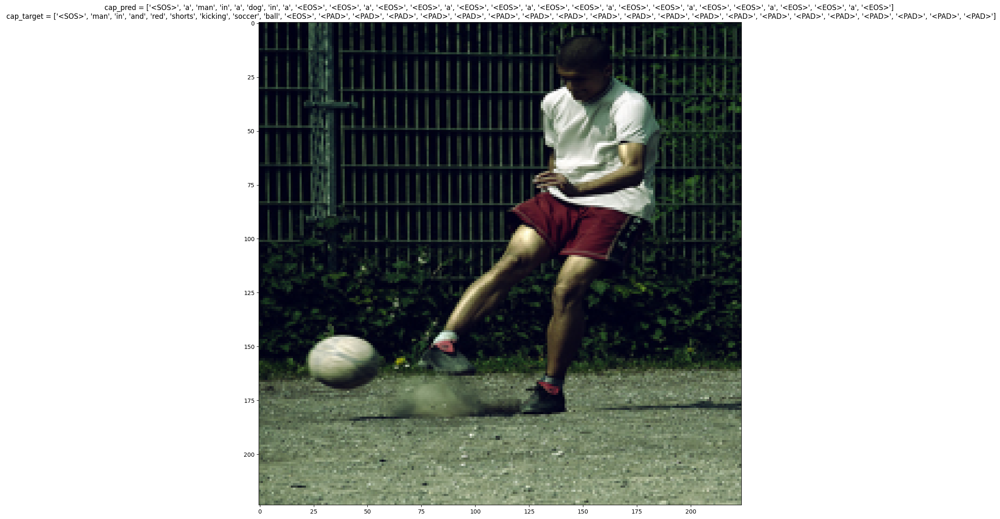

at epoch = 2 || train loss = 0.069
Checkpoint saved at epoch 2.


Epoch = 2: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'in', 'a', 'red', 'shirt', '<EOS>', 'a', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'three', 'people', 'are', 'waiting', 'on', 'the', 'curb', 'as', 'a', 'man', 'walks', 'by', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


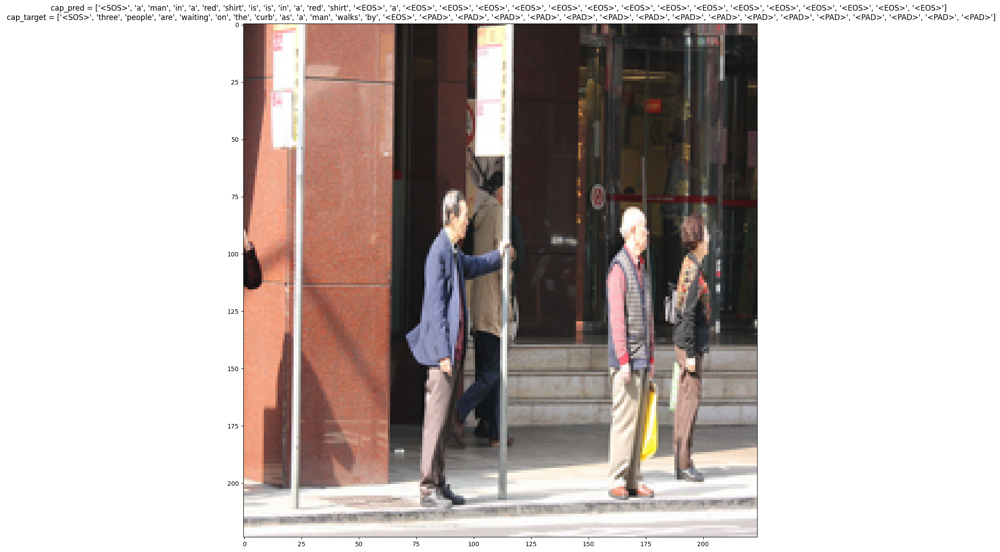

at epoch = 3 || train loss = 0.064


Epoch = 3: 100%|██████████| 632/632 [06:25<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'is', 'in', 'a', 'red', 'shirt', '<EOS>', 'a', '<UNK>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'man', 'stands', 'on', 'a', 'rock', 'and', 'takes', 'in', 'the', 'view', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


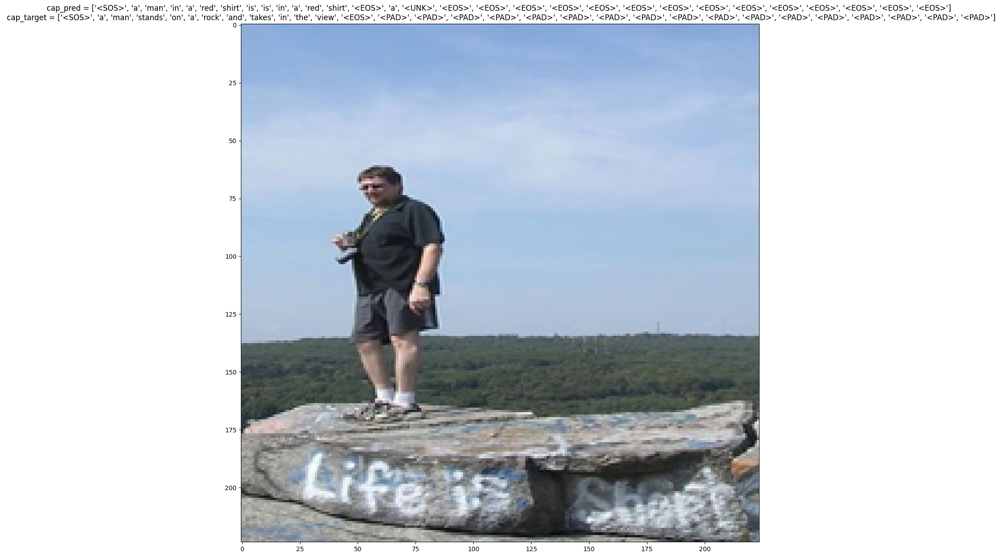

at epoch = 4 || train loss = 0.061
Checkpoint saved at epoch 4.


Epoch = 4: 100%|██████████| 632/632 [06:23<00:00,  1.65it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'in', 'a', 'water', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'muzzled', 'white', 'dog', 'is', 'running', 'on', 'the', 'grass', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


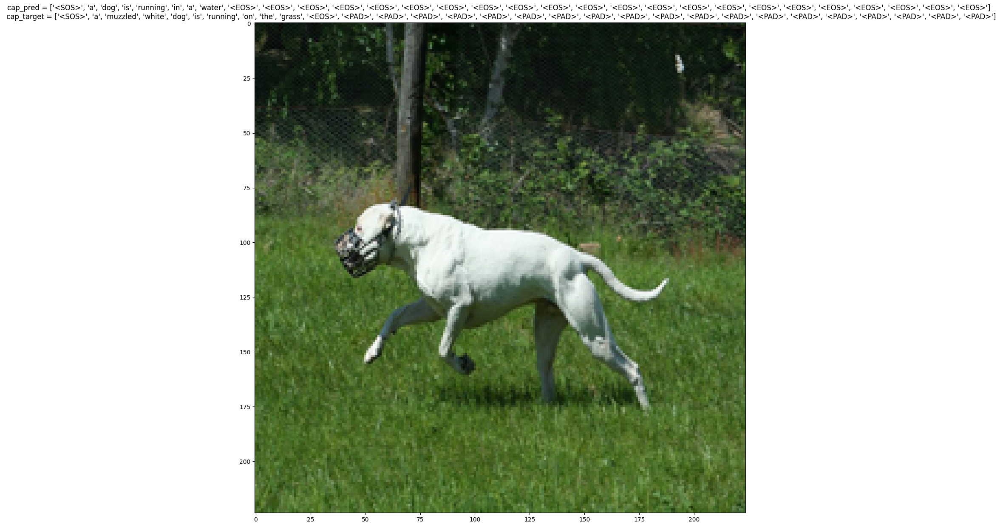

at epoch = 5 || train loss = 0.059


Epoch = 5: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'running', 'on', 'a', 'beach', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'woman', 'sits', 'on', 'a', 'rock', 'by', 'the', 'water', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


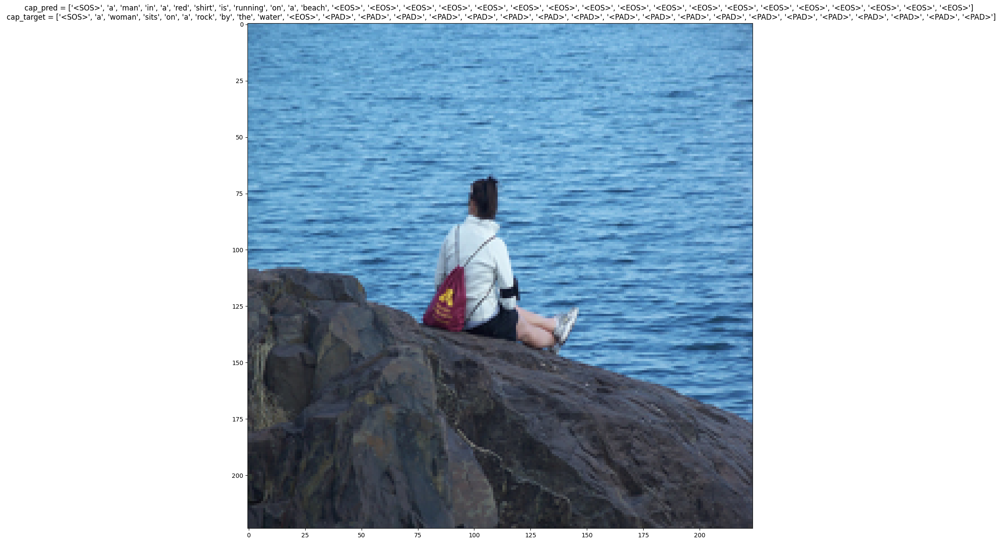

at epoch = 6 || train loss = 0.057
Checkpoint saved at epoch 6.


Epoch = 6: 100%|██████████| 632/632 [06:24<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'small', 'girl', 'puts', 'confetti', 'on', 'a', 'smiling', 'woman', 's', 'hair', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


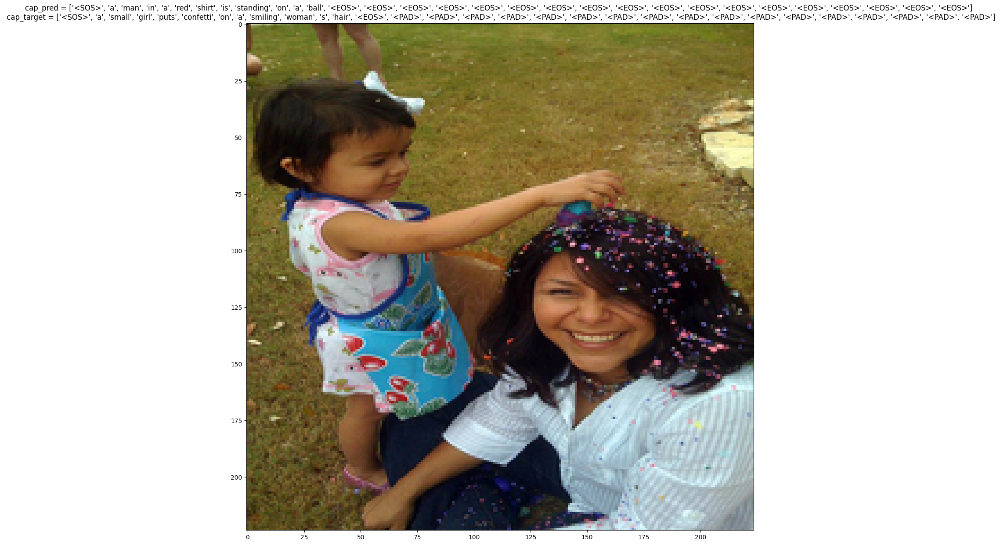

at epoch = 7 || train loss = 0.055


Epoch = 7: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'in', 'the', 'grass', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'two', 'brown', 'dogs', 'fight', 'on', 'the', 'leafy', 'ground', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


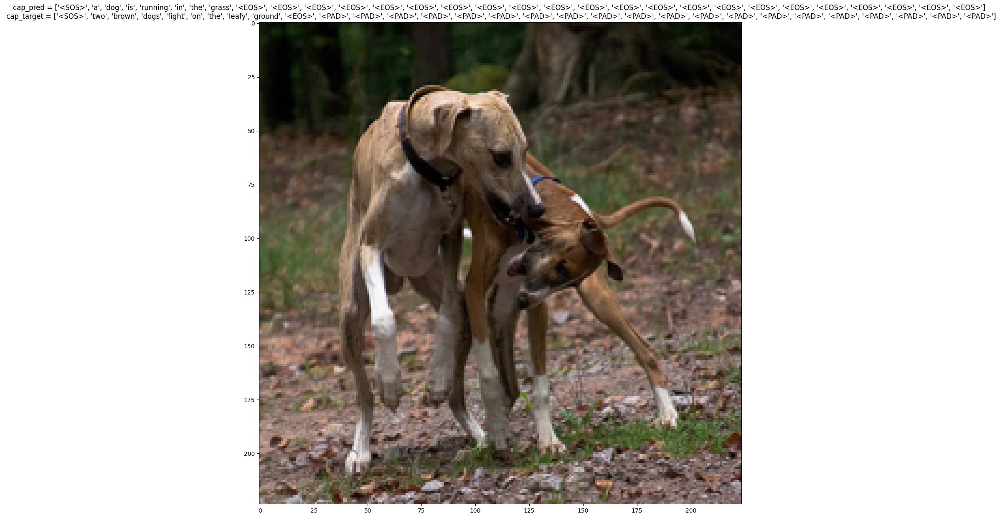

at epoch = 8 || train loss = 0.054
Checkpoint saved at epoch 8.


Epoch = 8: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'rugby', 'player', 'attempts', 'to', 'break', 'free', 'of', 'an', 'opposing', 'player', 'with', 'both', 'teams', 'closing', 'in', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


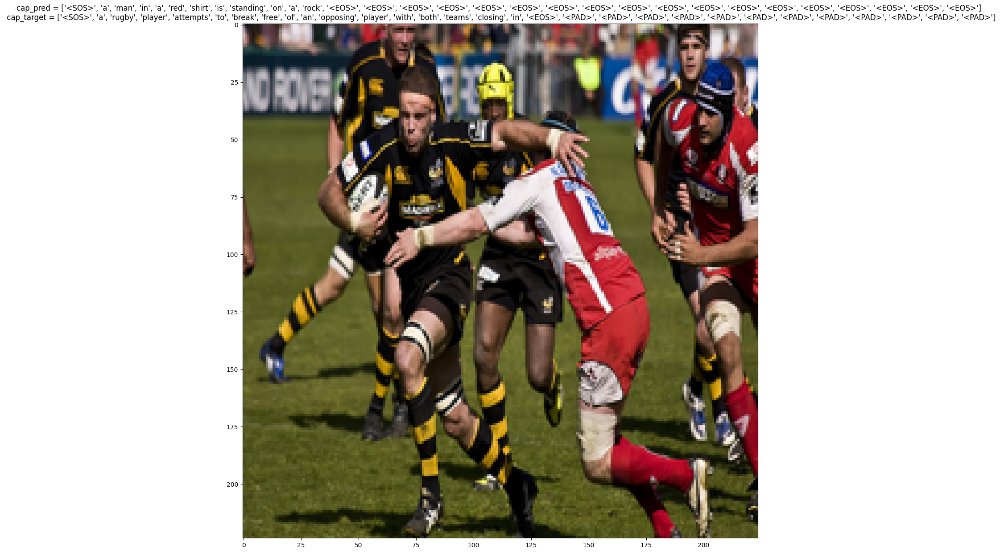

at epoch = 9 || train loss = 0.053


Epoch = 9: 100%|██████████| 632/632 [06:24<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'man', 'climbing', 'the', 'face', 'of', 'a', 'rock', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


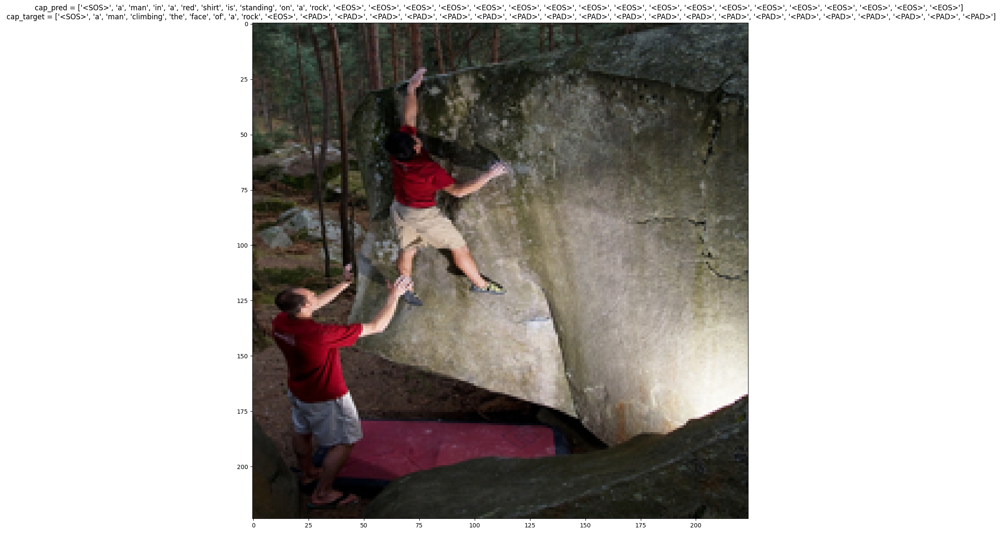

at epoch = 10 || train loss = 0.052
Checkpoint saved at epoch 10.


Epoch = 10: 100%|██████████| 632/632 [06:23<00:00,  1.65it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'rock', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'man', 'stands', 'on', 'a', 'rock', 'and', 'takes', 'in', 'the', 'view', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


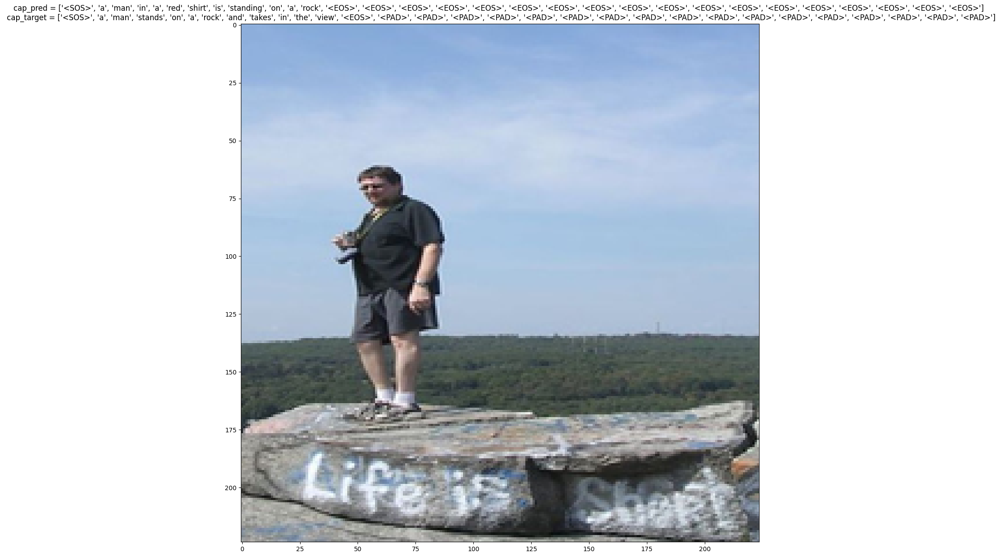

at epoch = 11 || train loss = 0.051


Epoch = 11: 100%|██████████| 632/632 [06:20<00:00,  1.66it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'water', '<EOS>', 'to', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'two', 'dogs', 'fight', 'over', 'a', 'stick', 'in', 'a', 'flooded', 'field', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


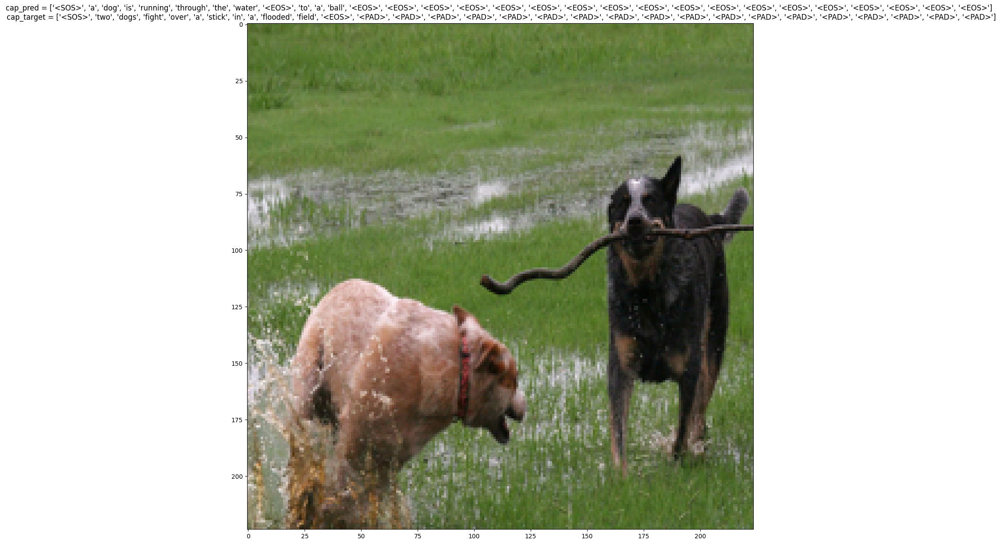

at epoch = 12 || train loss = 0.050
Checkpoint saved at epoch 12.


Epoch = 12: 100%|██████████| 632/632 [06:23<00:00,  1.65it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>', 'to', 'a', 'man', 'in', 'a', 'red', 'shirt', '<EOS>', 'to', 'a', 'man', '<EOS>', 'a', '<UNK>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'skateboarder', 'on', 'the', 'gray', 'steps', 'on', 'a', 'large', 'building', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


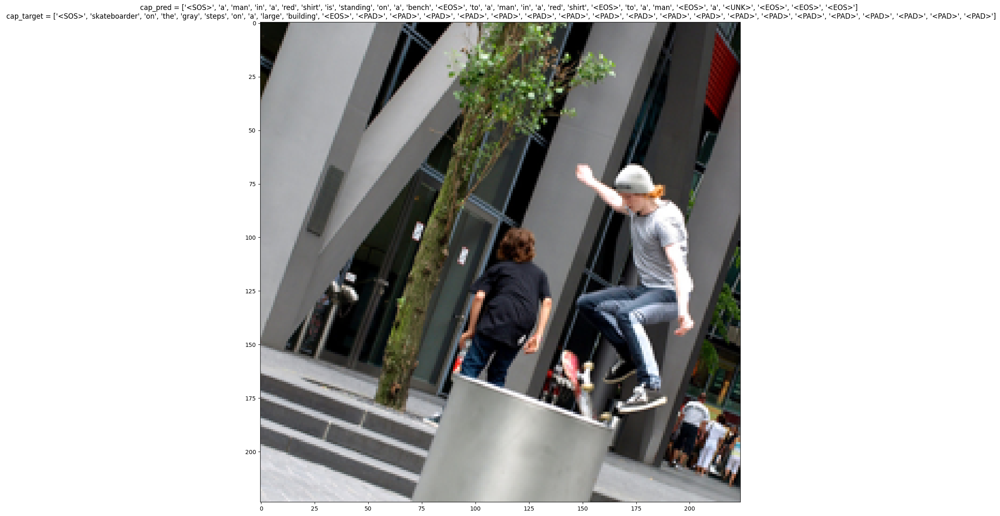

at epoch = 13 || train loss = 0.050


Epoch = 13: 100%|██████████| 632/632 [06:19<00:00,  1.67it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'water', '<EOS>', 'to', 'catch', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'black', 'and', 'white', 'dog', 'is', 'leaping', 'from', 'a', 'snowy', 'path', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


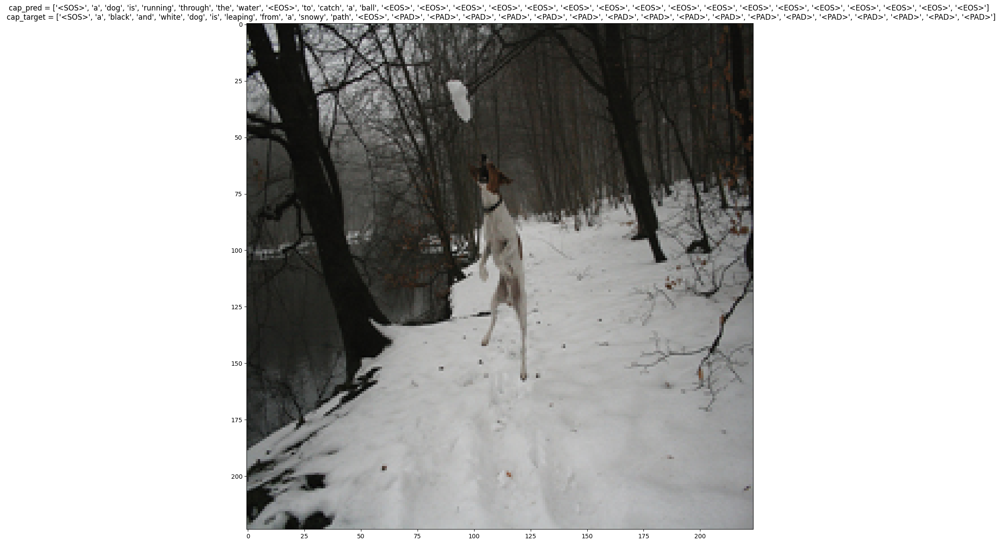

at epoch = 14 || train loss = 0.049
Checkpoint saved at epoch 14.


Epoch = 14: 100%|██████████| 632/632 [06:21<00:00,  1.65it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'large', 'wild', 'cat', 'is', '<UNK>', 'a', 'horse', 'across', 'a', 'meadow', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


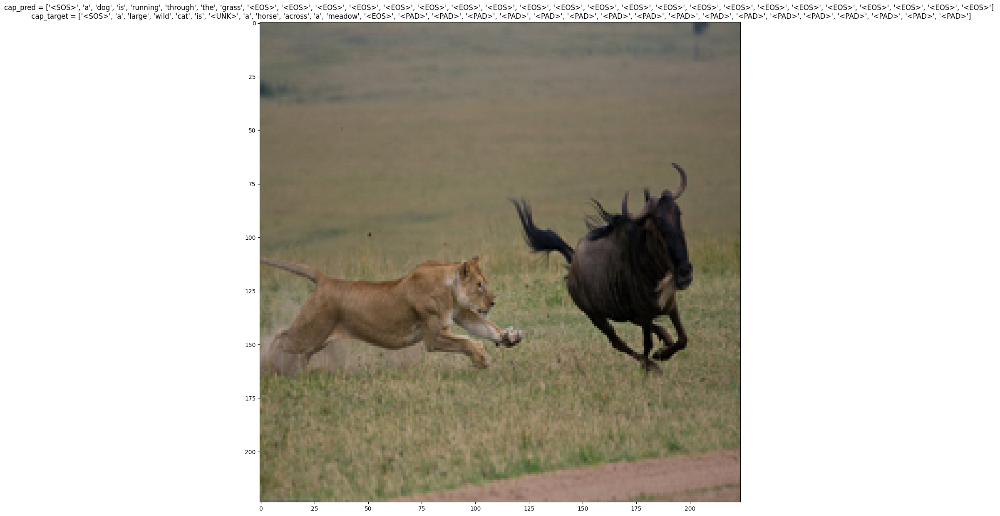

at epoch = 15 || train loss = 0.048


Epoch = 15: 100%|██████████| 632/632 [06:23<00:00,  1.65it/s]


['<SOS>', 'a', 'group', 'of', 'people', 'are', 'sitting', 'on', 'a', 'bench', '<EOS>', 'a', '<UNK>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'very', 'large', 'group', 'of', 'people', 'standing', 'crowded', 'together', 'outside', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


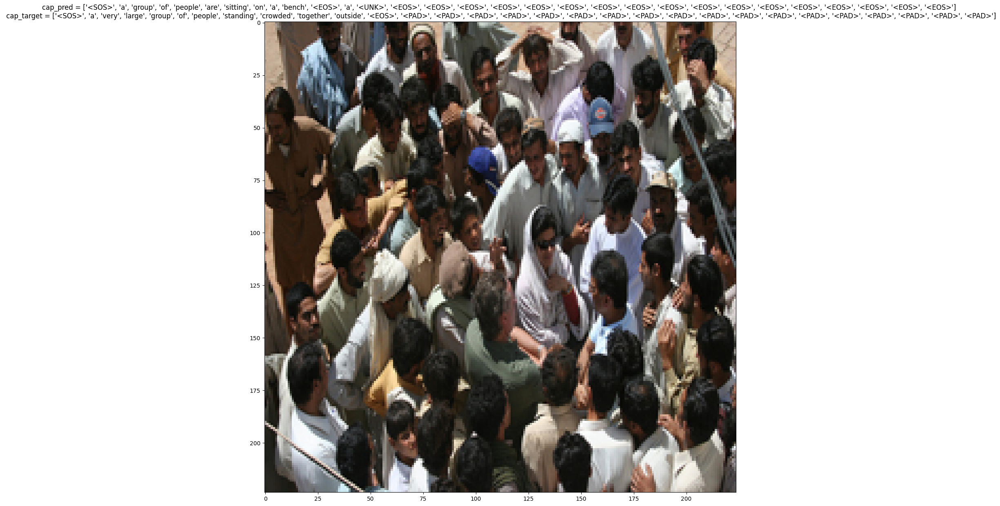

at epoch = 16 || train loss = 0.048
Checkpoint saved at epoch 16.


Epoch = 16: 100%|██████████| 632/632 [06:24<00:00,  1.64it/s]


['<SOS>', 'a', 'girl', 'in', 'a', 'blue', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'small', 'girl', 'puts', 'confetti', 'on', 'a', 'smiling', 'woman', 's', 'hair', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


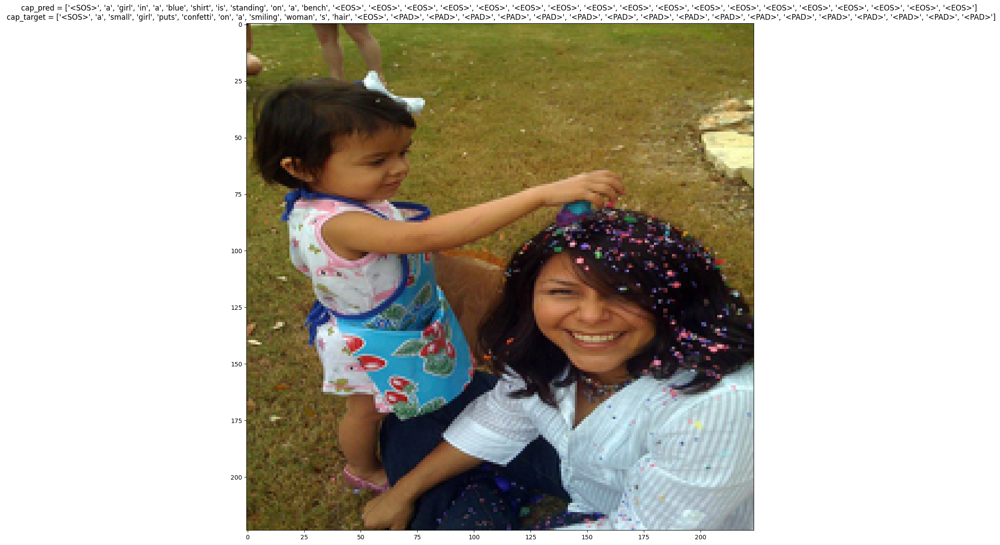

at epoch = 17 || train loss = 0.047


Epoch = 17: 100%|██████████| 632/632 [06:25<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'blue', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>', 'to', 'a', 'man', 'in', 'a', 'red', 'shirt', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'man', 'climbing', 'the', 'face', 'of', 'a', 'rock', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


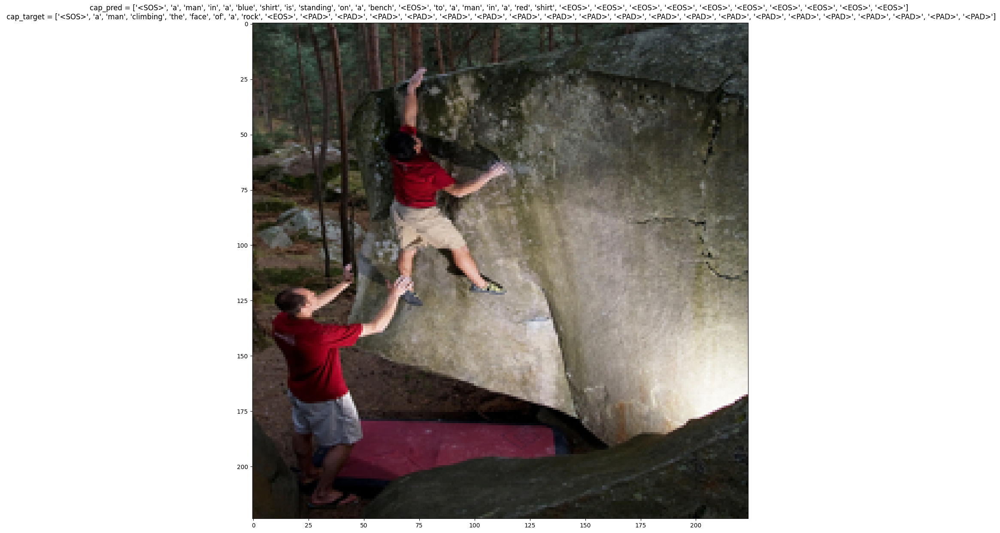

at epoch = 18 || train loss = 0.047
Checkpoint saved at epoch 18.


Epoch = 18: 100%|██████████| 632/632 [06:24<00:00,  1.65it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'riding', 'a', 'bicycle', 'on', 'a', 'dirt', 'hill', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'skateboarder', 'is', 'riding', 'on', 'a', 'red', 'ramp', 'by', 'the', 'ocean', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


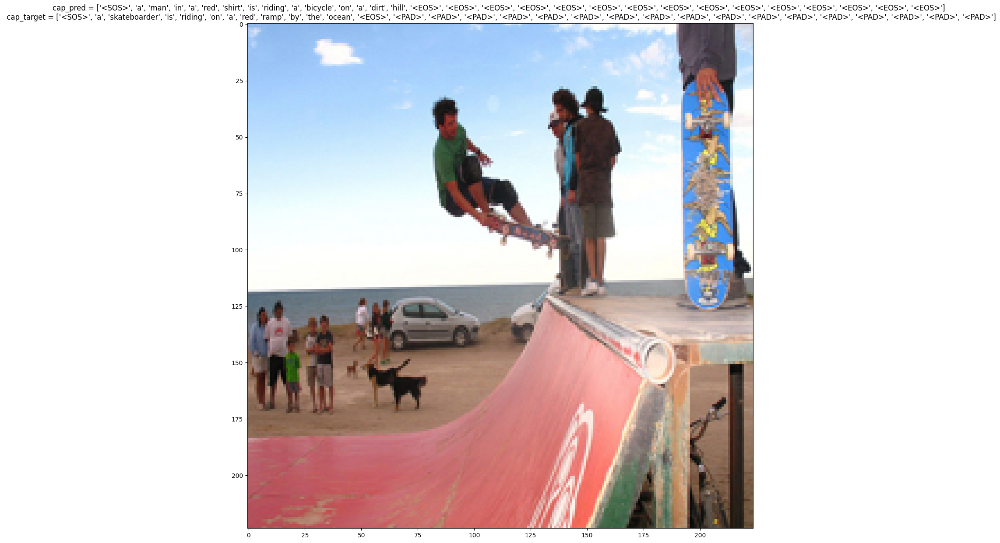

at epoch = 19 || train loss = 0.046


Epoch = 19: 100%|██████████| 632/632 [06:23<00:00,  1.65it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'blue', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'skateboarder', 'is', 'riding', 'on', 'a', 'red', 'ramp', 'by', 'the', 'ocean', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


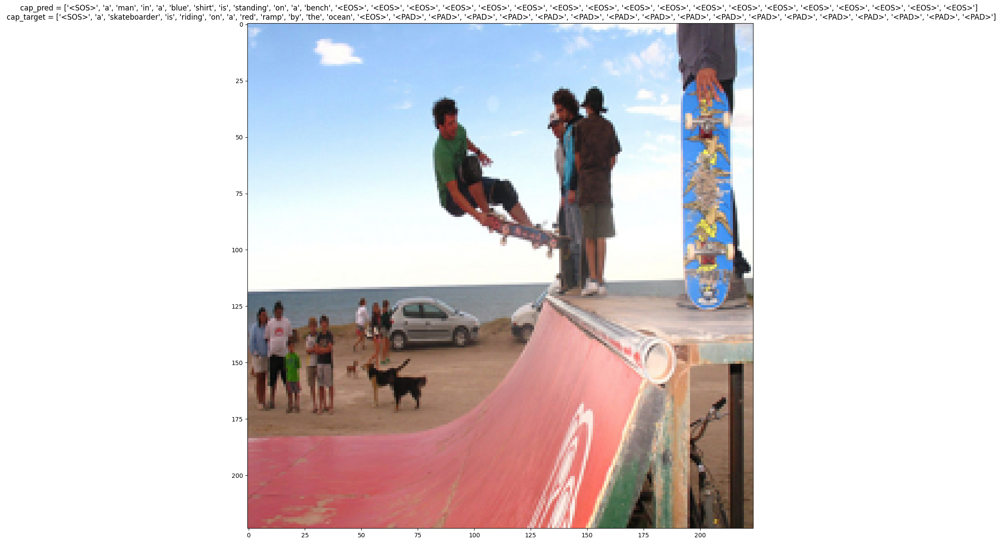

at epoch = 20 || train loss = 0.046
Checkpoint saved at epoch 20.


Epoch = 20: 100%|██████████| 632/632 [06:22<00:00,  1.65it/s]


['<SOS>', 'a', 'football', 'player', 'in', 'a', 'red', 'uniform', 'is', 'playing', 'a', 'ball', '<EOS>', 'to', 'a', 'man', 'in', 'a', 'red', 'shirt', '<EOS>', 'to', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'football', 'players', 'on', 'a', 'feild', 'the', 'one', 'on', 'the', 'left', 'in', 'a', 'blue', 'uniform', 'the', 'one', 'on', 'the', 'right', 'in', 'a', 'white', 'one', 'with', 'the', 'fans', 'in', 'the', 'back']


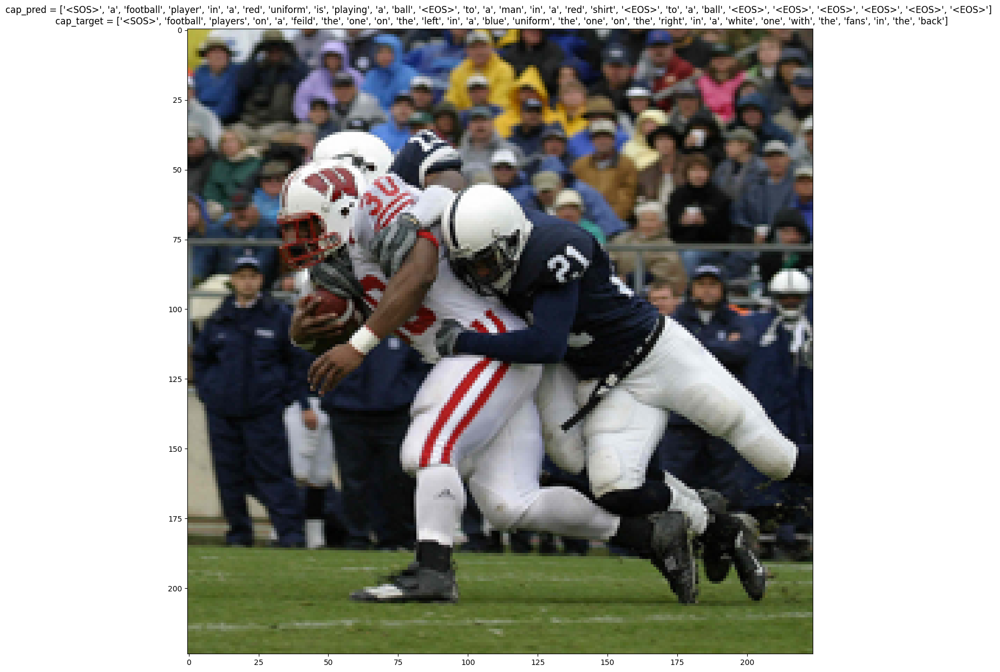

at epoch = 21 || train loss = 0.045


Epoch = 21: 100%|██████████| 632/632 [06:29<00:00,  1.62it/s]


['<SOS>', 'a', 'boy', 'in', 'a', 'red', 'shirt', 'is', 'playing', 'in', 'a', 'field', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'man', 'in', 'and', 'red', 'shorts', 'kicking', 'soccer', 'ball', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


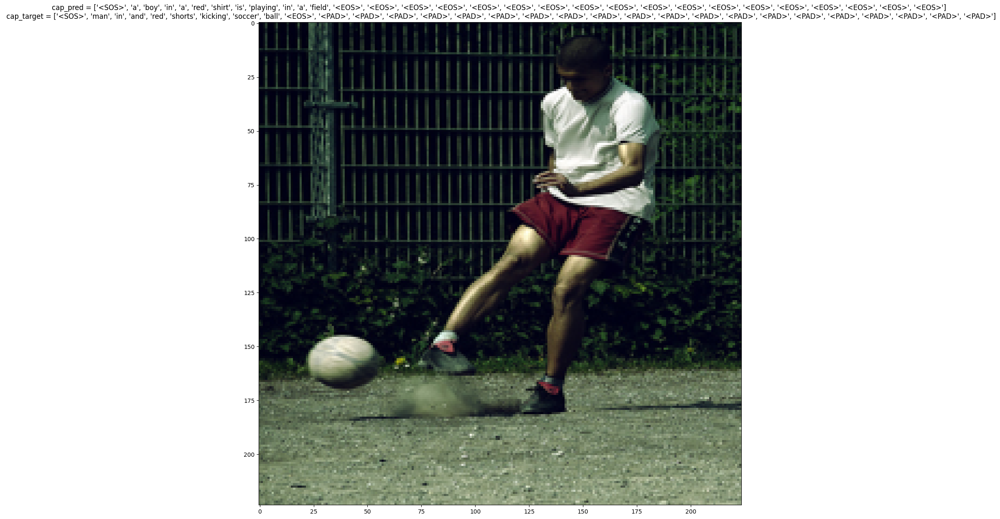

at epoch = 22 || train loss = 0.045
Checkpoint saved at epoch 22.


Epoch = 22: 100%|██████████| 632/632 [06:24<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'and', 'a', 'black', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'young', 'child', 'climbing', 'on', 'a', 'chain', 'link', 'fence', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


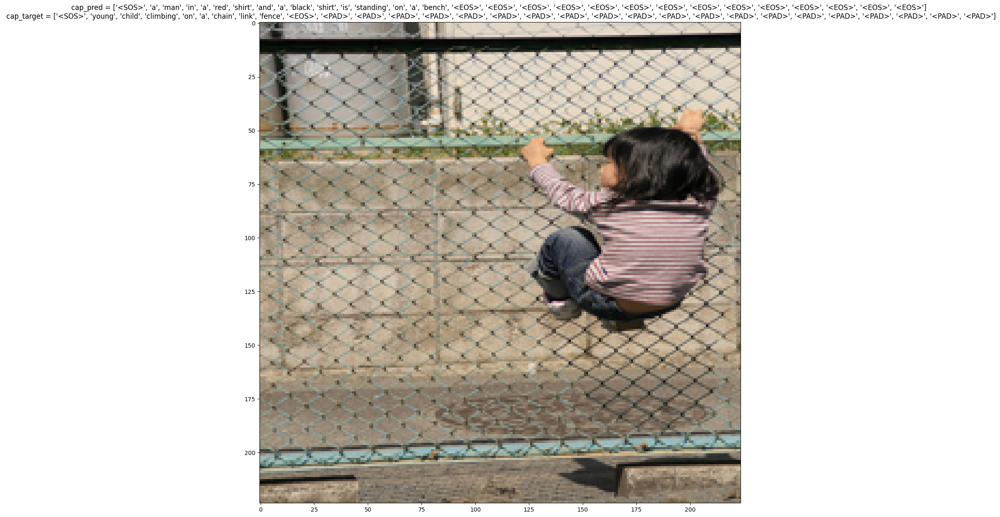

at epoch = 23 || train loss = 0.045


Epoch = 23: 100%|██████████| 632/632 [06:26<00:00,  1.63it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'snow', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'black', 'and', 'white', 'dog', 'is', 'leaping', 'from', 'a', 'snowy', 'path', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


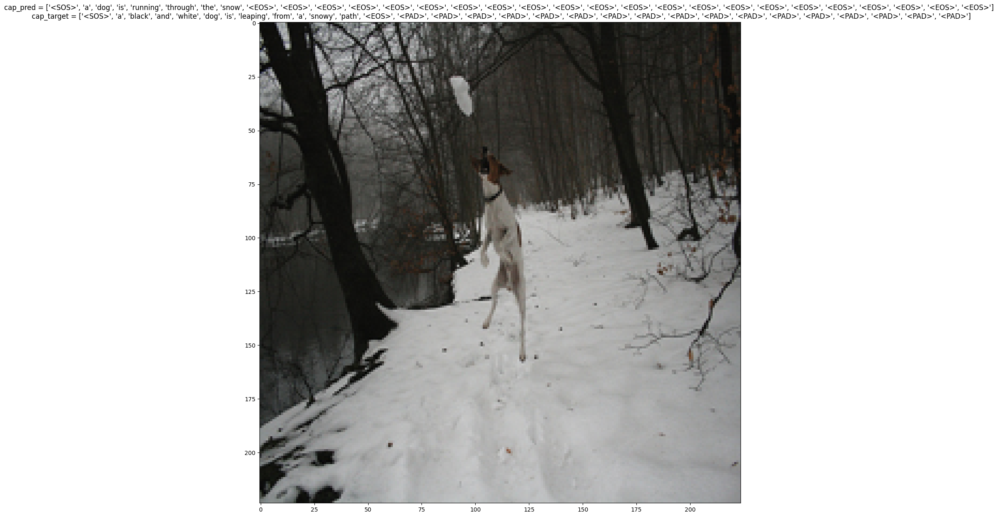

at epoch = 24 || train loss = 0.044
Checkpoint saved at epoch 24.


Epoch = 24: 100%|██████████| 632/632 [06:21<00:00,  1.66it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'a', 'field', '<EOS>', 'to', 'catch', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'the', 'black', 'and', 'white', 'dog', 'is', 'running', 'on', 'the', 'grass', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


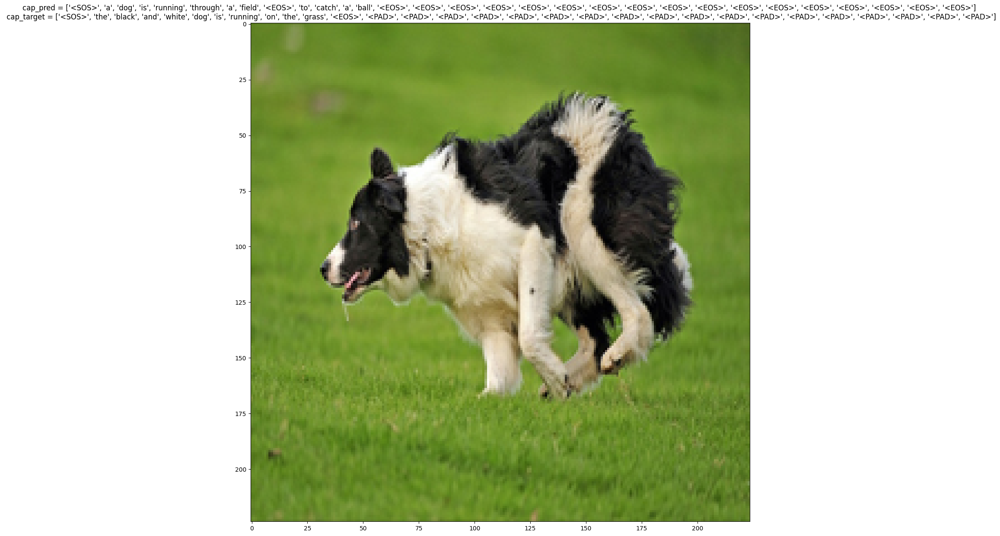

at epoch = 25 || train loss = 0.044


Epoch = 25: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'group', 'of', 'people', 'are', 'standing', 'on', 'a', 'snowy', 'hill', '<EOS>', 'to', 'a', '<UNK>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'people', 'in', 'a', 'brown', 'boat', 'float', 'down', 'the', 'street', 'of', 'a', 'city', 'built', 'on', 'water', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


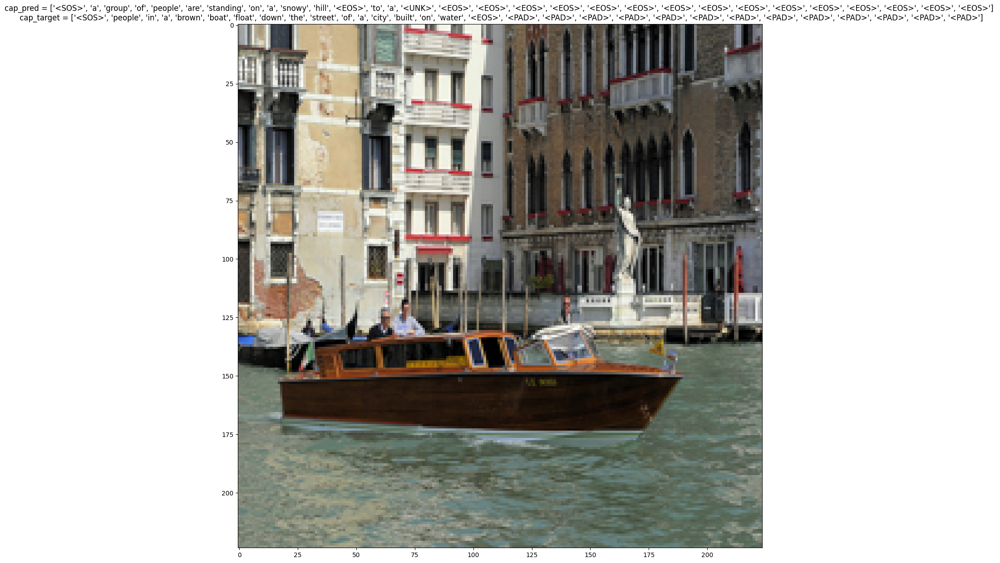

at epoch = 26 || train loss = 0.044
Checkpoint saved at epoch 26.


Epoch = 26: 100%|██████████| 632/632 [06:21<00:00,  1.66it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'water', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'black', 'dog', 'walks', 'along', 'a', 'marsh', 's', 'edge', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


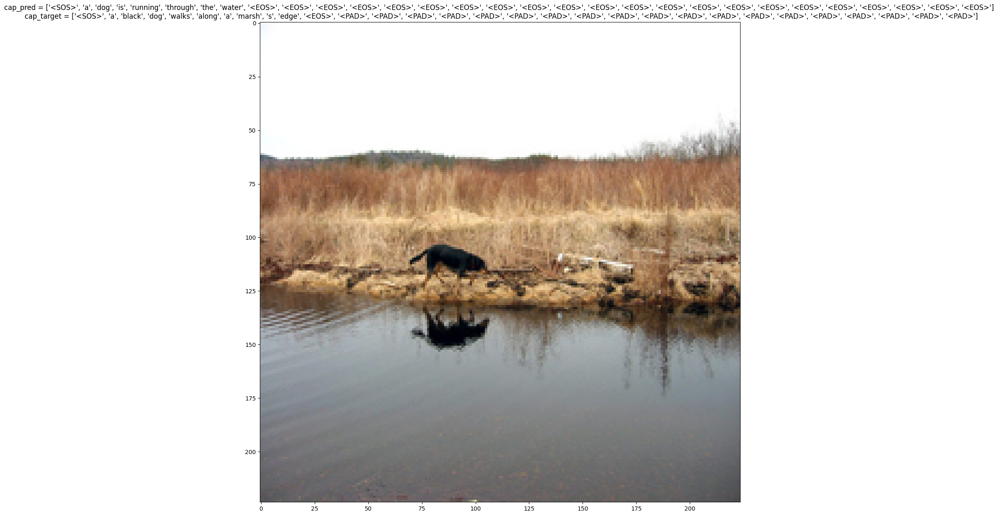

at epoch = 27 || train loss = 0.043


Epoch = 27: 100%|██████████| 632/632 [06:26<00:00,  1.64it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'water', '<EOS>', 'to', 'catch', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'as', 'the', 'dog', 'swims', 'close', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


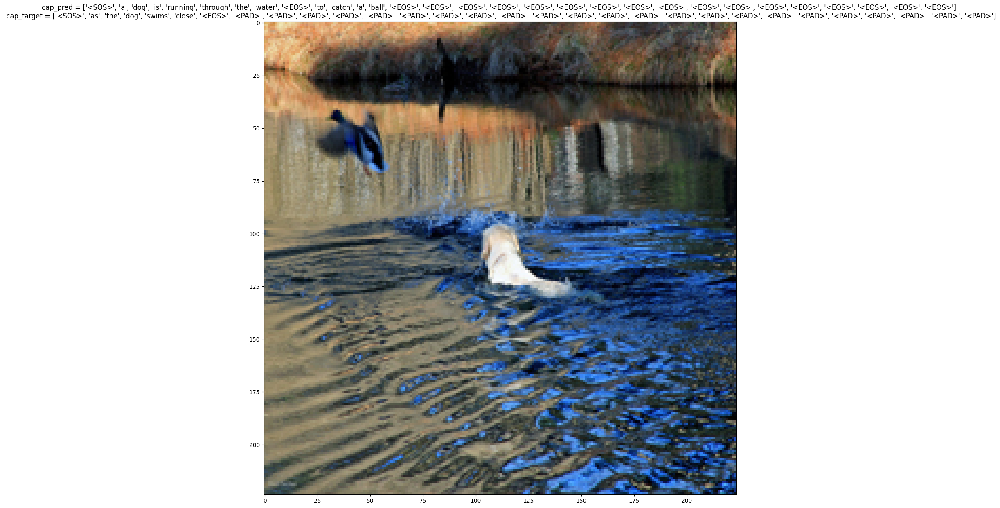

at epoch = 28 || train loss = 0.043
Checkpoint saved at epoch 28.


Epoch = 28: 100%|██████████| 632/632 [06:25<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'riding', 'a', 'bike', 'on', 'a', 'dirt', 'road', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'person', 'on', 'a', 'bmx', 'bike', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


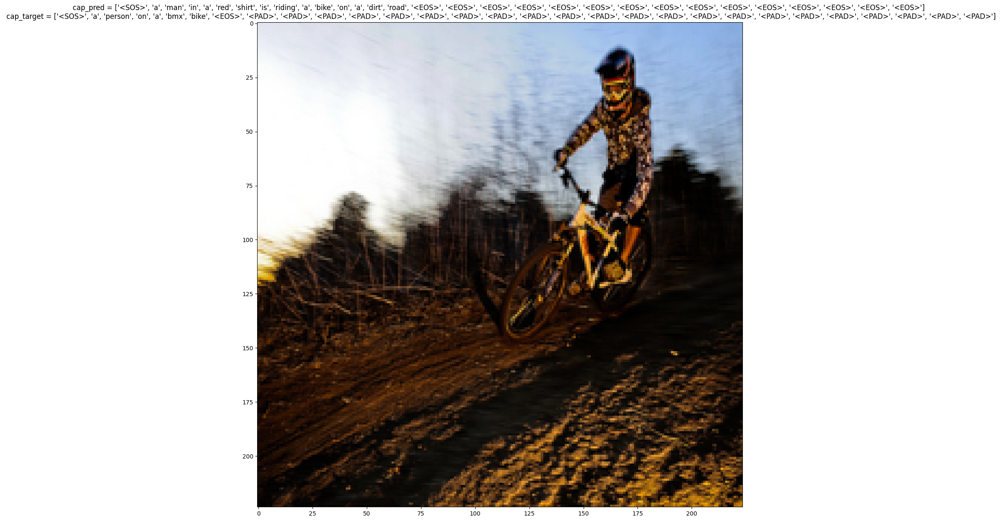

at epoch = 29 || train loss = 0.043


Epoch = 29: 100%|██████████| 632/632 [06:22<00:00,  1.65it/s]


['<SOS>', 'a', 'dog', 'is', 'running', 'through', 'the', 'snow', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'two', 'dogs', 'fight', 'over', 'a', 'stick', 'in', 'a', 'flooded', 'field', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


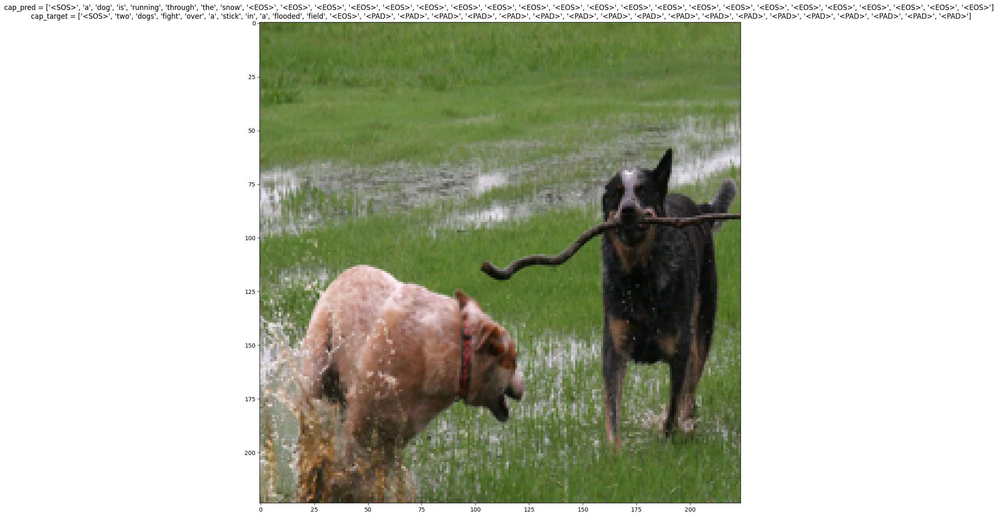

at epoch = 30 || train loss = 0.042
Checkpoint saved at epoch 30.


Epoch = 30: 100%|██████████| 632/632 [06:27<00:00,  1.63it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'black', 'shirt', 'is', 'standing', 'on', 'a', 'bench', 'in', 'front', 'of', 'a', 'building', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'skateboarder', 'on', 'the', 'gray', 'steps', 'on', 'a', 'large', 'building', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


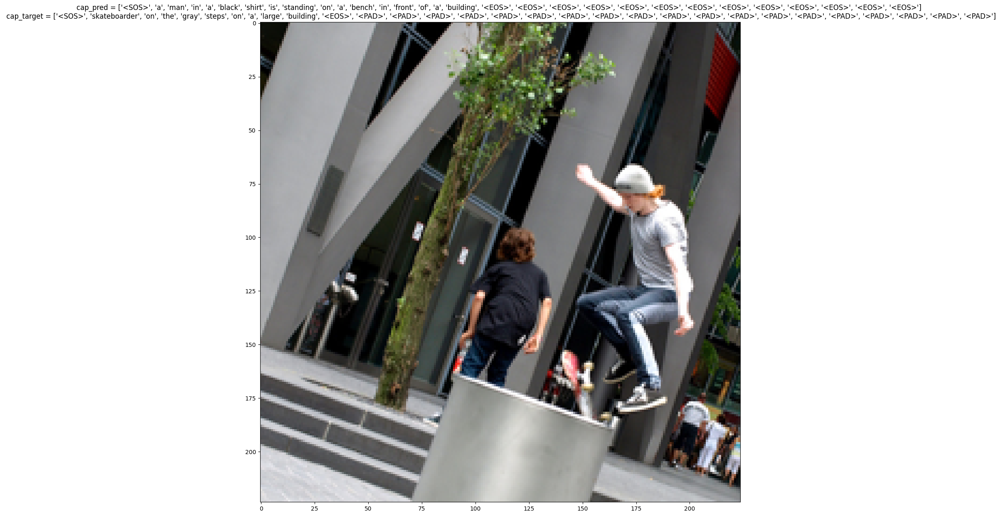

at epoch = 31 || train loss = 0.042


Epoch = 31: 100%|██████████| 632/632 [06:35<00:00,  1.60it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'shirt', 'is', 'riding', 'a', 'bike', 'on', 'a', 'dirt', 'hill', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'person', 'on', 'a', 'bmx', 'bike', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


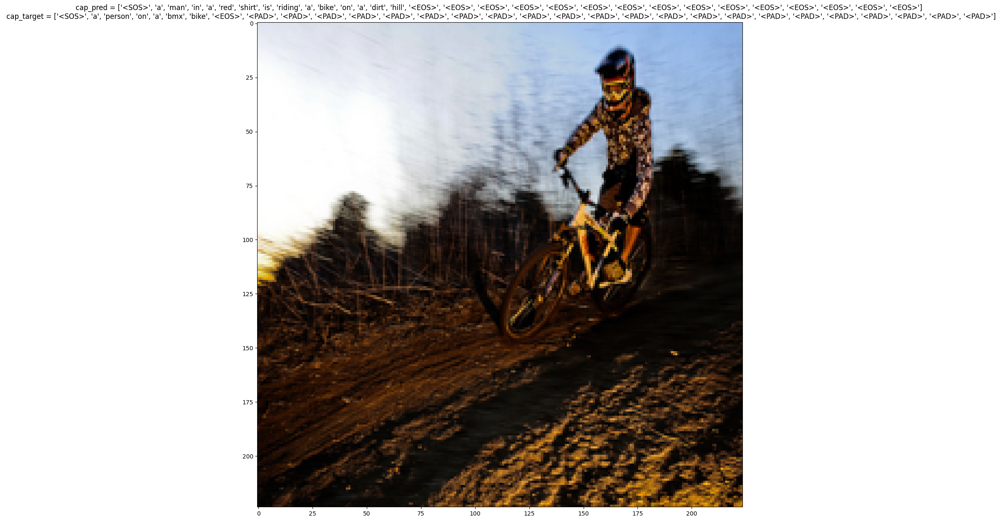

at epoch = 32 || train loss = 0.042
Checkpoint saved at epoch 32.


Epoch = 32: 100%|██████████| 632/632 [06:32<00:00,  1.61it/s]


['<SOS>', 'a', 'brown', 'dog', 'is', 'running', 'through', 'the', 'grass', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'two', 'dogs', 'fight', 'over', 'a', 'stick', 'in', 'a', 'flooded', 'field', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


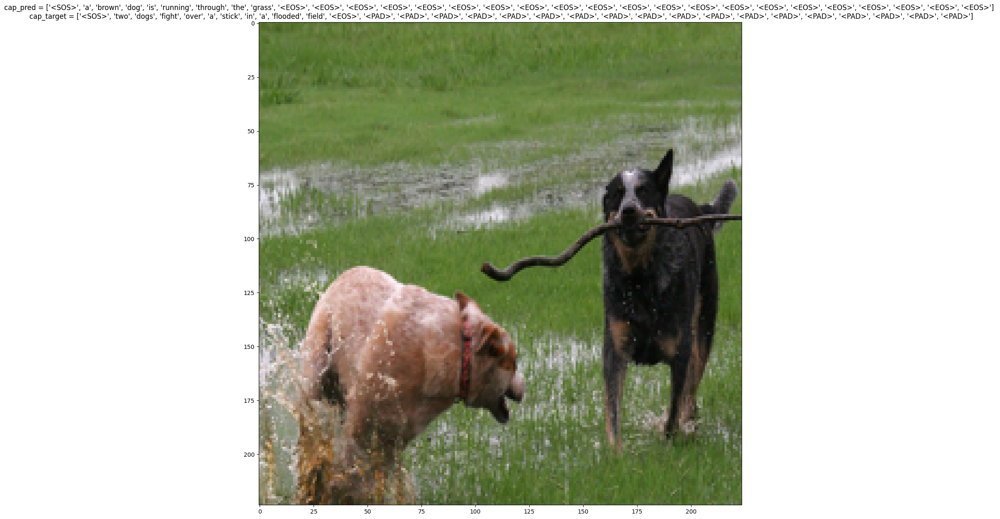

at epoch = 33 || train loss = 0.042


Epoch = 33: 100%|██████████| 632/632 [06:34<00:00,  1.60it/s]


['<SOS>', 'a', 'little', 'girl', 'in', 'a', 'pink', 'dress', 'is', 'playing', 'with', 'a', 'red', 'ball', '<EOS>', 'to', 'a', 'tree', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'girl', 'in', 'pink', 'picks', 'flowers', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


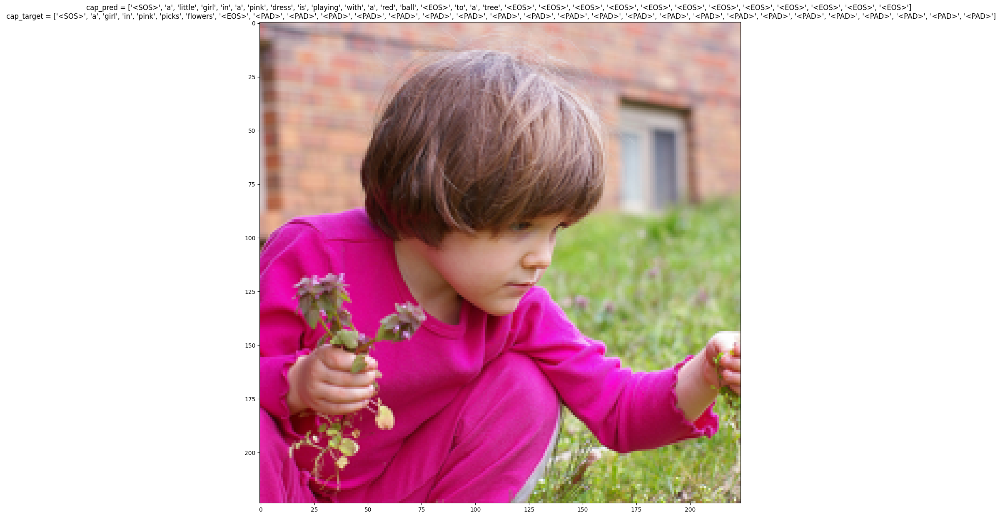

at epoch = 34 || train loss = 0.041
Checkpoint saved at epoch 34.


Epoch = 34: 100%|██████████| 632/632 [06:32<00:00,  1.61it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'red', 'jacket', 'is', 'riding', 'a', 'bike', 'on', 'a', 'snowy', 'hill', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'two', 'children', 'play', 'in', 'the', 'snow', 'with', 'a', 'sled', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


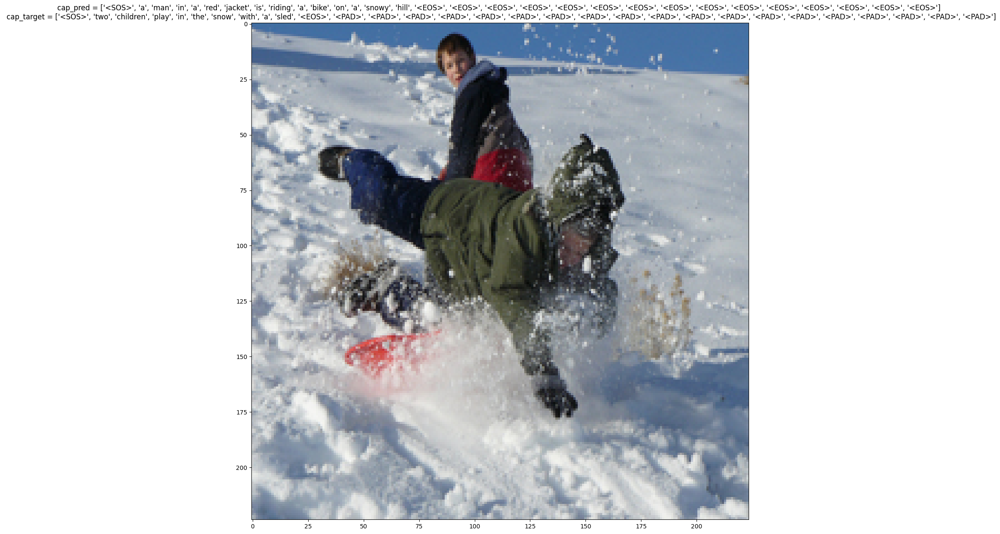

at epoch = 35 || train loss = 0.041


Epoch = 35: 100%|██████████| 632/632 [06:29<00:00,  1.62it/s]


['<SOS>', 'a', 'little', 'girl', 'in', 'a', 'pink', 'dress', 'is', 'playing', 'with', 'a', 'red', 'ball', '<EOS>', 'to', 'the', 'ground', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'small', 'girl', 'puts', 'confetti', 'on', 'a', 'smiling', 'woman', 's', 'hair', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


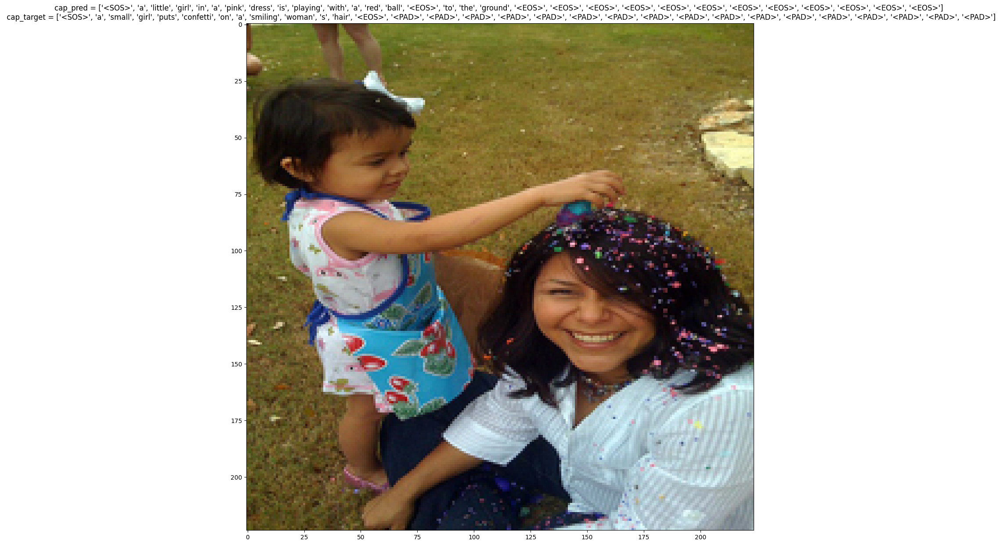

at epoch = 36 || train loss = 0.041
Checkpoint saved at epoch 36.


Epoch = 36: 100%|██████████| 632/632 [06:30<00:00,  1.62it/s]


['<SOS>', 'a', 'black', 'dog', 'is', 'running', 'through', 'a', 'field', 'of', 'water', '<EOS>', 'to', 'catch', 'a', 'ball', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'a', 'brown', 'dog', 'leaps', 'in', 'the', 'air', 'to', 'catch', 'a', 'white', 'volleyball', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


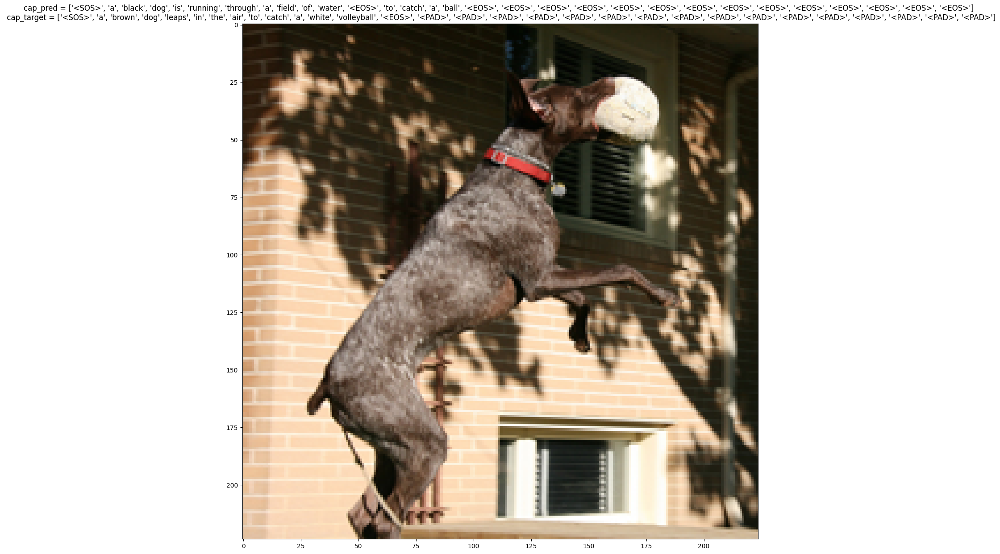

at epoch = 37 || train loss = 0.041


Epoch = 37: 100%|██████████| 632/632 [06:25<00:00,  1.64it/s]


['<SOS>', 'a', 'man', 'in', 'a', 'black', 'shirt', 'and', 'a', 'black', 'shirt', 'is', 'standing', 'on', 'a', 'bench', '<EOS>', 'to', 'a', 'man', 'in', 'a', 'blue', 'shirt', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>', '<EOS>']
['<SOS>', 'young', 'child', 'climbing', 'on', 'a', 'chain', 'link', 'fence', '<EOS>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>']


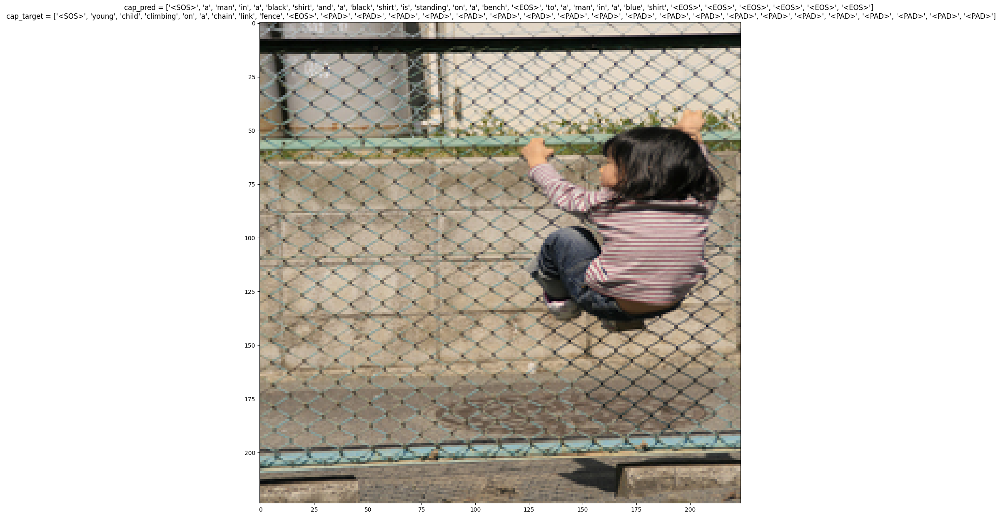

at epoch = 38 || train loss = 0.041
Checkpoint saved at epoch 38.


Epoch = 38:  88%|████████▊ | 557/632 [05:40<00:45,  1.66it/s]

In [ ]:
if __name__ == "__main__":
    train_loss_l=our_train(epochs=config_hp["EPOCHS"],our_model=our_lstm_model)

    plot_l_a(train_loss_l,train_loss_l,train_loss_l,train_loss_l,"lstm-3_plot_training_results.png")


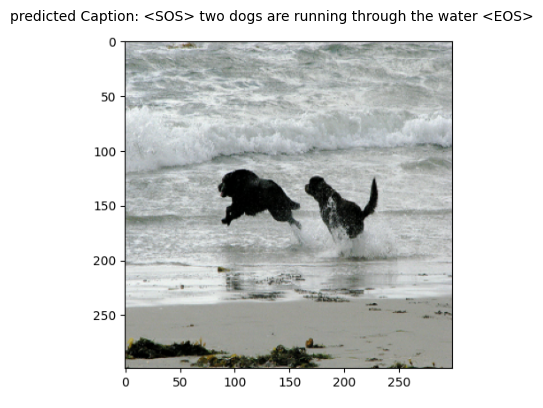

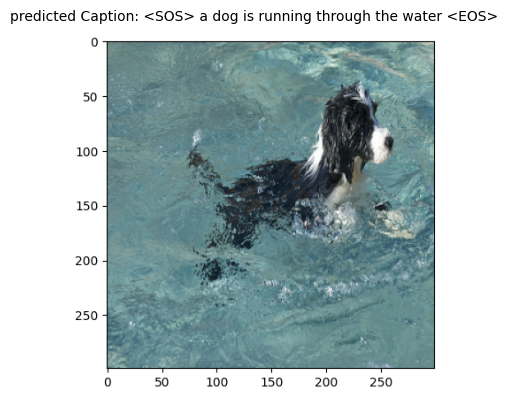

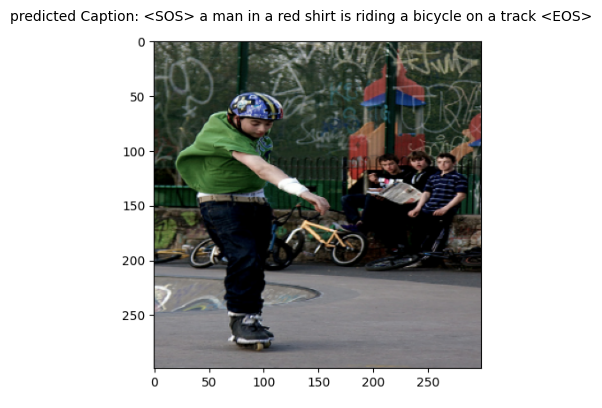

In [9]:


import torch
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image


our_train_data_loader, our_test_data_loader,our_train_data_set,our_test_data_set,our_vocab,x_test=get_datasets_and_loaders_for_lstm()

device="cuda" if torch.cuda.is_available() else "cpu"


our_lstm_model=OurModel(config_hp["FEATURE_EMBEDDING_SIZE"],config_hp["LSTM_HIDDEN_SIZE"],config_hp["MAX_VOCAB"],config_hp["LSTM_N_LAYERS"]).to(device)
checkpoint = torch.load("/kaggle/input/7777777777777l/model_checkpoint.pth",map_location=torch.device('cpu'))
our_lstm_model.load_state_dict(checkpoint['model_state_dict'])



def image_captioning(img_dir, our_model, our_vocab, device):
    
    our_model.eval()
    with torch.inference_mode():
    
      #ran=torch.randint(0,40,(1,)).item()
    
      img=Image.open(img_dir).convert('RGB')
    

      
        
      #t_img=our_test[ran][0].to(device).unsqueeze(0)
        
      t_img=trans_test(img).to(device).unsqueeze(0)
      x=our_model.encoder(t_img) # 1*100
      state=None  
      final_output=[] 
       
      for _ in range (config_hp["MAX_LEN"]):

          x,state=our_model.decoder.lstm(x,state) #1*256
          x=our_model.decoder.linear(x)  #1*256 * 256*4000 >>>1*4000
          x=torch.argmax(torch.softmax(x,dim=1) ,dim=1).squeeze().cpu().detach().numpy() #1*30*1 >>> 30
          
          x=our_vocab.lookup_token(x)     #[t for t in  our_vocab.lookup_tokens(cap_pred) if t!=1 ]
          
          final_output.append(x)
          if x==config_hp["SPECIAL_TOKENS"][3]: 
              break 
          x=torch.tensor(our_vocab([x])).to(device)#.unsqueeze(0)
         # print(x.shape)
          x=our_model.decoder.embedding(x)
          
    plt.imshow(img)
    title=" ".join(final_output)
    plt.axis('off')
    plt.title(f"predicted Caption: {title}",fontsize=10)
    plt.show()
         
    return final_output
      
    
if __name__=="__main__":
    for img_dir in os.listdir(r"/kaggle/input/ff-frk"):
        
        img_dir = os.path.join(r"/kaggle/input/ff-frk", img_dir)
        
        caption= image_captioning(img_dir, our_lstm_model, our_vocab, device)
        #print("Caption: ", " ".join(caption))
        
    


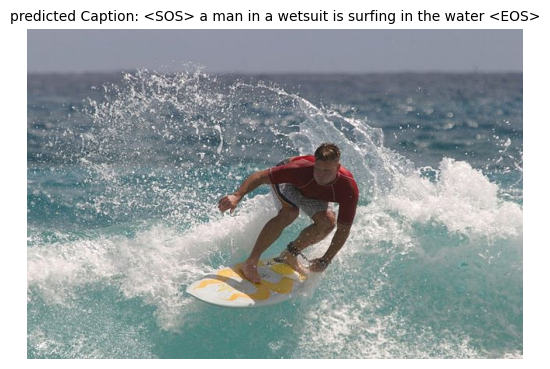

In [10]:
img_dir = "/kaggle/input/jkdndkk/surf.jpg"

caption= image_captioning(img_dir, our_lstm_model, our_vocab, device)

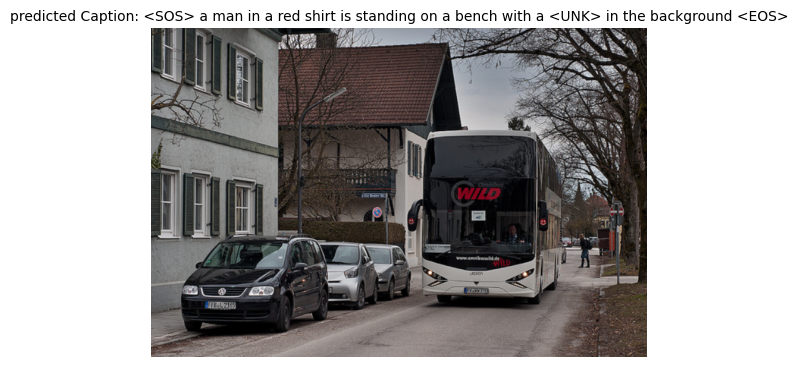

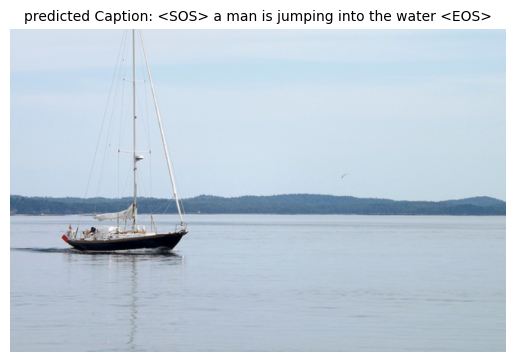

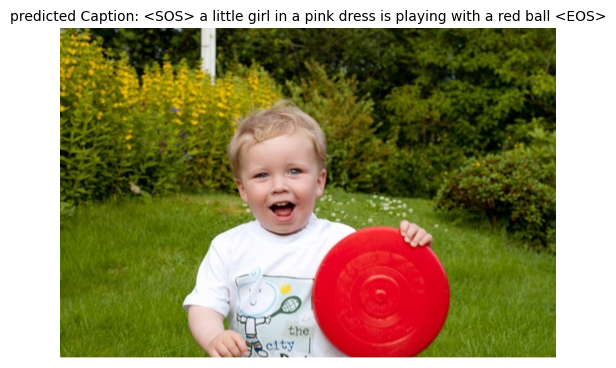

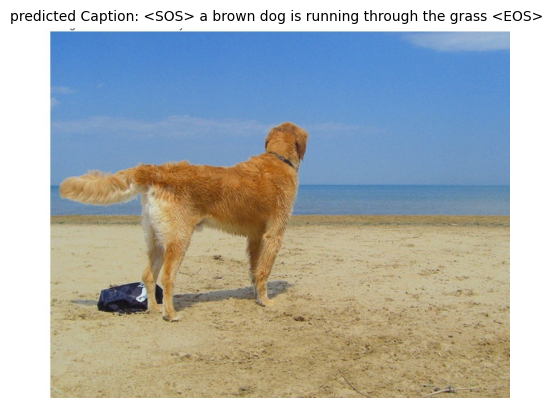

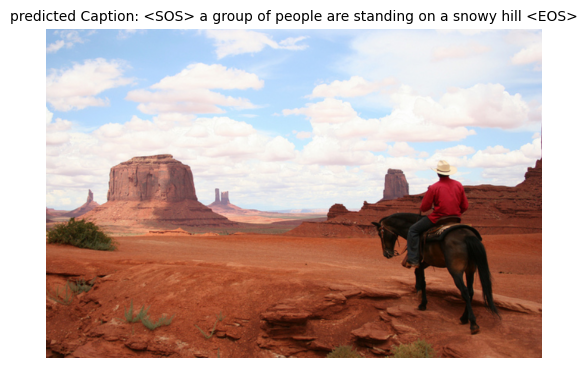

In [11]:
if __name__=="__main__":
    for img_dir in os.listdir(r"/kaggle/input/dhujehfbb"):
        
        img_dir = os.path.join(r"/kaggle/input/dhujehfbb", img_dir)
        
        caption= image_captioning(img_dir, our_lstm_model, our_vocab, device)
        #print("Caption: ", " ".join(caption))
        

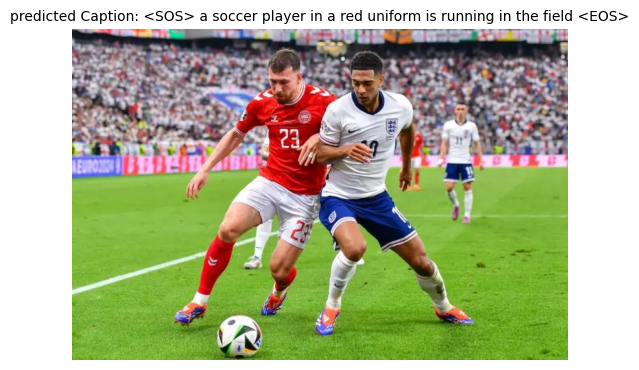

In [12]:
img_dir = "/kaggle/input/mmmmmmm3rfd/Hojbjerg20Bellingham.jpeg"

caption= image_captioning(img_dir, our_lstm_model, our_vocab, device)